<a href="https://colab.research.google.com/github/frank-bobbio/test/blob/master/Copia_de_NOTEBOOK_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PROCESAMIENTO Y MODELADO

## Conexión a recursos

In [ ]:
# Constante para determinar si el notebook se ejecuta en colab o no.

COLAB = False
#COLAB = True

# Ruta para la carga de los datasets
if COLAB:
  # Ruta para el almacenamiento de los profiles que se generen
  PATH_PROFILE = '/content/drive/MyDrive/CaixaBank INTEGRA IA (documentacion Oficial)/Notebook/Profiles/'

  # Ruta para el almacenamiento del df_unificado que se genere
  PATH_UNIFICADO = '/content/drive/MyDrive/CaixaBank INTEGRA IA (documentacion Oficial)/Notebook/DF-Unificado/'

else:
  PATH = './Raw-Dataset/'
  PATH_PROFILE = './Profiles/'
  PATH_UNIFICADO = 'C:/Users/zabdiel/Documents/Norma/MIA - España/Máster/TFM/Datasets/'


## Librerías

In [ ]:
if COLAB:
  !pip install session_info
  from google.colab import drive

!pip install sinfo
!pip install Fitter
!pip install mlflow

import re
import os
import sys
import glob
import mlflow
import pandas as pd
import numpy as np
import keras
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import matplotlib.pyplot as plt
from fitter import Fitter
from collections import Counter
import scipy.stats as stats
from sinfo import sinfo

import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split

import statsmodels.api as sm
from sklearn.feature_selection import RFECV
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
from imblearn.pipeline import Pipeline
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_validate
from xgboost import XGBClassifier, plot_importance

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
from xgboost import XGBRegressor

from sklearn import metrics
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix

import lightgbm as lgb
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

from mlxtend.evaluate import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix


[notice] A new release of pip available: 22.1.2 -> 22.3
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip available: 22.1.2 -> 22.3
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip available: 22.1.2 -> 22.3
[notice] To update, run: python.exe -m pip install --upgrade pip


## Inicialización de variables

In [ ]:
# Estructuras tipo lista para el registro de experimentos con mlflow
l_clasificadores = []
l_parametros = []
l_metrica_accuracy = []
l_metrica_precision = []
l_metrica_recall = []
l_metrica_f1 = []
l_modelos = []

## Configuración para acceder a mlflow

In [ ]:
# Datos para acceder al MLFlow server
os.environ['MLFLOW_TRACKING_USERNAME'] = 'mlflow'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'TFM6'
mlflow.set_tracking_uri("http://52.45.72.29:5001/")


## Carga de dataset unificado

In [ ]:
if COLAB:
  drive.mount('/content/drive')

In [ ]:
# Visualización de todas las columnas en los datasets
pd.set_option('display.max_columns', None)

In [ ]:
# Cargar del dataset unificado proveniente del Notebook_2
data = pd.read_csv('C:/Users/psyco/Màster_Three_Points/TFM/Code_TFM/Notebook_3/Final_notebooks/df_unificado_v2_4_Notebook_3.csv', engine="python", sep=',')

In [ ]:
# Forma y visualización del dataset
shape1 = data.shape
print(f'Forma actual del dataset: {shape1}')
data.head()

Forma actual del dataset: (42491, 562)


,Unnamed: 0,NM,WGUID,SystemId,Fecha Cierre,target,semana,mes,num_reacondicionamientos,AGE,VWTIME_1W_WACTIVE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,VWTIME_2W_WACTIVE,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,VWTIME_1M_WACTIVE,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,VWTIME_total_WACTIVE,WACTIVE_total_min,WACTIVE_total_mean,WACTIVE_total_std,WACTIVE_total_max,WACTIVE_ult_registro,WACTIVE_fecha_registro_mas_reciente,VWTIME_1W_WSCORE,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,VWTIME_2W_WSCORE,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,VWTIME_1M_WSCORE,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,VWTIME_total_WSCORE,WSCORE_total_min,WSCORE_total_mean,WSCORE_total_std,WSCORE_total_max,WSCORE_ult_registro,WSCORE_fecha_registro_mas_reciente,VWTIME_1W_WSUMMARY,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,VWTIME_2W_WSUMMARY,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,VWTIME_1M_WSUMMARY,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,VWTIME_total_WSUMMARY,WSUMMARY_total_min,WSUMMARY_total_mean,WSUMMARY_total_std,WSUMMARY_total_max,WSUMMARY_ult_registro,WSUMMARY_fecha_registro_mas_reciente,VWTIME_1W_DISK_COST,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,VWTIME_2W_DISK_COST,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,VWTIME_1M_DISK_COST,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,VWTIME_total_DISK_COST,DISK_COST_total_min,DISK_COST_total_mean,DISK_COST_total_std,DISK_COST_total_max,DISK_COST_ult_registro,DISK_COST_fecha_registro_mas_reciente,VWTIME_1W_MEM_COST,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,VWTIME_2W_MEM_COST,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,VWTIME_1M_MEM_COST,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,VWTIME_total_MEM_COST,MEM_COST_total_min,MEM_COST_total_mean,MEM_COST_total_std,MEM_COST_total_max,MEM_COST_ult_registro,MEM_COST_fecha_registro_mas_reciente,VWTIME_1W_CPU_COST,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,VWTIME_2W_CPU_COST,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,VWTIME_1M_CPU_COST,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,VWTIME_total_CPU_COST,CPU_COST_total_min,CPU_COST_total_mean,CPU_COST_total_std,CPU_COST_total_max,CPU_COST_ult_registro,CPU_COST_fecha_registro_mas_reciente,VWTIME_1W_HWPROBLEM_COST,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,VWTIME_2W_HWPROBLEM_COST,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,VWTIME_1M_HWPROBLEM_COST,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,VWTIME_total_HWPROBLEM_COST,HWPROBLEM_COST_total_min,HWPROBLEM_COST_total_mean,HWPROBLEM_COST_total_std,HWPROBLEM_COST_total_max,HWPROBLEM_COST_ult_registro,HWPROBLEM_COST_fecha_registro_mas_reciente,VWTIME_1W_WFAULT_COST,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,VWTIME_2W_WFAULT_COST,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,VWTIME_1M_WFAULT_COST,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,VWTIME_total_WFAULT_COST,WFAULT_COST_total_min,WFAULT_COST_total_mean,WFAULT_COST_total_std,WFAULT_COST_total_max,WFAULT_COST_ult_registro,WFAULT_COST_fecha_registro_mas_reciente,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,FAULTS_total,NUMFLTS_total_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,HANGS_total,NUMFLTS_total_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,BSODS_total,NUMFLTS_total_BSODS,VWTIME_1W_WLEVEL,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,VWTIME_2W_WLEVEL,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEV

In [ ]:
# Información de las características del dataset
data.info(verbose=True,null_counts=True)

C:\Users\psyco\AppData\Local\Temp\ipykernel_21844\2894201808.py:2: FutureWarning: null_counts is deprecated. Use show_counts instead
  data.info(verbose=True,null_counts=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42491 entries, 0 to 42490
Data columns (total 562 columns):
 #    Column                                                Non-Null Count  Dtype  
---   ------                                                --------------  -----  
 0    Unnamed: 0                                            42491 non-null  int64  
 1    NM                                                    42491 non-null  int64  
 2    WGUID                                                 42491 non-null  object 
 3    SystemId                                              42491 non-null  object 
 4    Fecha Cierre                                          1326 non-null   object 
 5    target                                                42491 non-null  int64  
 6    semana                                                1326 non-null   float64
 7    mes                                                   1326 non-null   float64
 8    num_reacondicionamientos                    

### Eliminación de columnas sin interés en la computación.

In [ ]:
# Borrado de columnas que no se usarán
data = data.drop('NM', axis=1)
data = data.drop('WGUID', axis=1)
data = data.drop('SystemId', axis=1)
data = data.drop('Unnamed: 0', axis=1)
data = data.drop('Fecha Cierre', axis=1)

shape2 = data.shape
print(f'Reducción de columnas: {shape1[1]-shape2[1]}')
print(f'Forma actual del dataset: {data.shape}')
data.head()

Reducción de columnas: 5
Forma actual del dataset: (42491, 557)


,target,semana,mes,num_reacondicionamientos,AGE,VWTIME_1W_WACTIVE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,VWTIME_2W_WACTIVE,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,VWTIME_1M_WACTIVE,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,VWTIME_total_WACTIVE,WACTIVE_total_min,WACTIVE_total_mean,WACTIVE_total_std,WACTIVE_total_max,WACTIVE_ult_registro,WACTIVE_fecha_registro_mas_reciente,VWTIME_1W_WSCORE,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,VWTIME_2W_WSCORE,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,VWTIME_1M_WSCORE,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,VWTIME_total_WSCORE,WSCORE_total_min,WSCORE_total_mean,WSCORE_total_std,WSCORE_total_max,WSCORE_ult_registro,WSCORE_fecha_registro_mas_reciente,VWTIME_1W_WSUMMARY,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,VWTIME_2W_WSUMMARY,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,VWTIME_1M_WSUMMARY,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,VWTIME_total_WSUMMARY,WSUMMARY_total_min,WSUMMARY_total_mean,WSUMMARY_total_std,WSUMMARY_total_max,WSUMMARY_ult_registro,WSUMMARY_fecha_registro_mas_reciente,VWTIME_1W_DISK_COST,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,VWTIME_2W_DISK_COST,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,VWTIME_1M_DISK_COST,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,VWTIME_total_DISK_COST,DISK_COST_total_min,DISK_COST_total_mean,DISK_COST_total_std,DISK_COST_total_max,DISK_COST_ult_registro,DISK_COST_fecha_registro_mas_reciente,VWTIME_1W_MEM_COST,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,VWTIME_2W_MEM_COST,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,VWTIME_1M_MEM_COST,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,VWTIME_total_MEM_COST,MEM_COST_total_min,MEM_COST_total_mean,MEM_COST_total_std,MEM_COST_total_max,MEM_COST_ult_registro,MEM_COST_fecha_registro_mas_reciente,VWTIME_1W_CPU_COST,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,VWTIME_2W_CPU_COST,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,VWTIME_1M_CPU_COST,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,VWTIME_total_CPU_COST,CPU_COST_total_min,CPU_COST_total_mean,CPU_COST_total_std,CPU_COST_total_max,CPU_COST_ult_registro,CPU_COST_fecha_registro_mas_reciente,VWTIME_1W_HWPROBLEM_COST,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,VWTIME_2W_HWPROBLEM_COST,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,VWTIME_1M_HWPROBLEM_COST,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,VWTIME_total_HWPROBLEM_COST,HWPROBLEM_COST_total_min,HWPROBLEM_COST_total_mean,HWPROBLEM_COST_total_std,HWPROBLEM_COST_total_max,HWPROBLEM_COST_ult_registro,HWPROBLEM_COST_fecha_registro_mas_reciente,VWTIME_1W_WFAULT_COST,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,VWTIME_2W_WFAULT_COST,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,VWTIME_1M_WFAULT_COST,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,VWTIME_total_WFAULT_COST,WFAULT_COST_total_min,WFAULT_COST_total_mean,WFAULT_COST_total_std,WFAULT_COST_total_max,WFAULT_COST_ult_registro,WFAULT_COST_fecha_registro_mas_reciente,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,FAULTS_total,NUMFLTS_total_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,HANGS_total,NUMFLTS_total_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,BSODS_total,NUMFLTS_total_BSODS,VWTIME_1W_WLEVEL,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,VWTIME_2W_WLEVEL,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEVEL_2W_max,VWTIME_1M_WLEVEL,WLEVEL_1M_min,W

In [ ]:
# Eliminamos todas las columnas que tienen fechas y valores totales.
for col in data.columns:
    if 'TIME' in col or 'fecha' in col or '_total' in col:
        data = data.drop(col, axis=1)

shape3 = data.shape
print(f'Reducción de columnas: {shape2[1]-shape3[1]}')
print(f'Forma actual del dataset: {data.shape}')
data.head()

Reducción de columnas: 222
Forma actual del dataset: (42491, 335)


,target,semana,mes,num_reacondicionamientos,AGE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,WSCORE_ult_registro,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,WSUMMARY_ult_registro,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,DISK_COST_ult_registro,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,CPU_COST_ult_registro,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,HWPROBLEM_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEVEL_2W_max,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_std,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1W_min,BootTime_1W_mean,BootTime_1W_std,BootTime_1W_max,BootTime_2W_min,BootTime_2W_mean,BootTime_2W_std,BootTime_2W_max,BootTime_1M_min,BootTime_1M_mean,BootTime_1M_std,BootTime_1M_max,BootTime_ult_registro,PNPInitDuration_1W_min,PNPInitDuration_1W_mean,PNPInitDuration_1W_std,PNPInitDuration_1W_max,PNPInitDuration_2W_min,PNPInitDuration_2W_mean,PNPInitDuration_2W_std,PNPInitDuration_2W_max,PNPInitDuration_1M_min,PNPInitDuration_1M_mean,PNPInitDuration_1M_std,PNPInitDuration_1M_max,PNPInitDuration_ult_registro,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_1W_mean,SessionInitStartTimeMS_1W_std,SessionInitStartTimeMS_1W_max,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_2W_mean,SessionInitStartTimeMS_2W_std,SessionInitStartTimeMS_2W_max,SessionInitStartTimeMS_1M_min,SessionInitStartTimeMS_1M_mean,SessionInitStartTimeMS_1M_std,SessionInitStartTimeMS_1M_max,SessionInitStartTimeMS_ult_registro,MainPathBootTime_1W_min,MainPathBootTime_1W_mean,MainPathBootTime_1W_std,MainPathBootTime_1W_max,MainPathBootTime_2W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_std,MainPathBootTime_2W_max,MainPathBootTime_1M_min,MainPathBootTime_1M_mean,MainPathBootTime_1M_std,MainPathBootTime_1M_max,MainPathBootTime_ult_registro,WinLogonStartTimeMS_1W_min,WinLogonStartTimeMS_1W_mean,WinLogonStartTimeMS_1W_std,WinLogonStartTimeMS_1W_max,WinLogonStartTimeMS_2W_min,WinLogonStartTimeMS_2W_mean,WinLogonStartTimeMS_2W_std,WinLogonStartTimeMS_2W_max,WinLogonStartTimeMS_1M_min,WinLogonStartTimeMS_1M_mean,WinLogonStartTimeMS_1M_std,WinLogonStartTimeMS_1M_max,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_1W_std,DriverInitTime_1W_max,

In [ ]:
# Observamos características con muy baja representatividad en los datos
num_reacond = (data['num_reacondicionamientos'] == 0).sum() *100 / len(data)
semana = data['semana'].isnull().sum() *100 / len(data)
mes = data['mes'].isnull().sum() *100 / len(data)

print(f'Pocentaje de nulos en las características:\n\nNumero de reacondicionamientos: {num_reacond:.3f}%\nsemana: {semana:.3f}%\nmes: {mes:.3f}%')

# Eliminamos las columnas semana y mes
data = data.drop('semana', axis=1)
data = data.drop('mes', axis=1)

# Comprobamos el dataset
shape4 = data.shape
print(f'Reducción de filas: {shape3[0]-shape4[0]}')
print(f'Forma actual del dataset: {shape4}')
data.head()

Pocentaje de nulos en las características:

Numero de reacondicionamientos: 99.758%
semana: 96.879%
mes: 96.879%
Reducción de filas: 0
Forma actual del dataset: (42491, 333)


,target,num_reacondicionamientos,AGE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,WSCORE_ult_registro,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,WSUMMARY_ult_registro,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,DISK_COST_ult_registro,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,CPU_COST_ult_registro,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,HWPROBLEM_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEVEL_2W_max,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_std,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1W_min,BootTime_1W_mean,BootTime_1W_std,BootTime_1W_max,BootTime_2W_min,BootTime_2W_mean,BootTime_2W_std,BootTime_2W_max,BootTime_1M_min,BootTime_1M_mean,BootTime_1M_std,BootTime_1M_max,BootTime_ult_registro,PNPInitDuration_1W_min,PNPInitDuration_1W_mean,PNPInitDuration_1W_std,PNPInitDuration_1W_max,PNPInitDuration_2W_min,PNPInitDuration_2W_mean,PNPInitDuration_2W_std,PNPInitDuration_2W_max,PNPInitDuration_1M_min,PNPInitDuration_1M_mean,PNPInitDuration_1M_std,PNPInitDuration_1M_max,PNPInitDuration_ult_registro,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_1W_mean,SessionInitStartTimeMS_1W_std,SessionInitStartTimeMS_1W_max,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_2W_mean,SessionInitStartTimeMS_2W_std,SessionInitStartTimeMS_2W_max,SessionInitStartTimeMS_1M_min,SessionInitStartTimeMS_1M_mean,SessionInitStartTimeMS_1M_std,SessionInitStartTimeMS_1M_max,SessionInitStartTimeMS_ult_registro,MainPathBootTime_1W_min,MainPathBootTime_1W_mean,MainPathBootTime_1W_std,MainPathBootTime_1W_max,MainPathBootTime_2W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_std,MainPathBootTime_2W_max,MainPathBootTime_1M_min,MainPathBootTime_1M_mean,MainPathBootTime_1M_std,MainPathBootTime_1M_max,MainPathBootTime_ult_registro,WinLogonStartTimeMS_1W_min,WinLogonStartTimeMS_1W_mean,WinLogonStartTimeMS_1W_std,WinLogonStartTimeMS_1W_max,WinLogonStartTimeMS_2W_min,WinLogonStartTimeMS_2W_mean,WinLogonStartTimeMS_2W_std,WinLogonStartTimeMS_2W_max,WinLogonStartTimeMS_1M_min,WinLogonStartTimeMS_1M_mean,WinLogonStartTimeMS_1M_std,WinLogonStartTimeMS_1M_max,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_1W_std,DriverInitTime_1W_max,DriverInitT

### Tratamiento de valores null y NaN

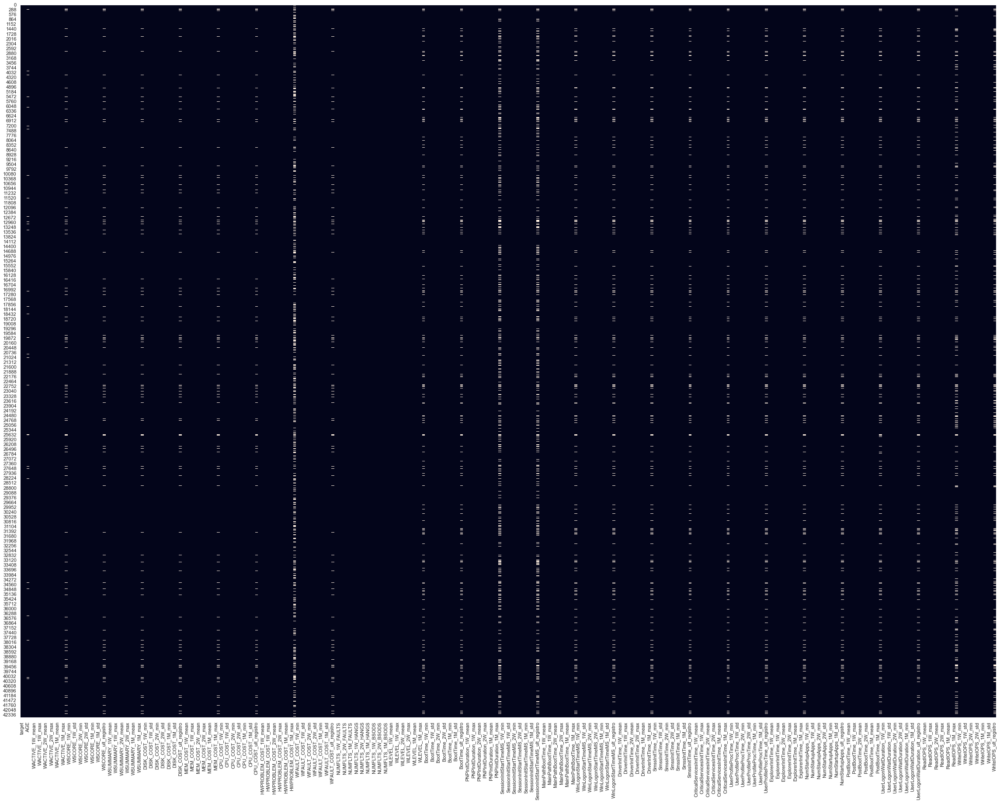

In [ ]:
# Gráfico de valores null en el dataframe
sns.set(rc = {'figure.figsize':(40, 30)})
sns.heatmap(data.isnull(), cbar=False);

In [ ]:
# Comprobamos la cantidad de valores nulos por característica
data.isna().sum()

target                         0
num_reacondicionamientos       0
AGE                          862
WACTIVE_1W_min                 0
WACTIVE_1W_mean                0
                            ... 
WriteIOPS_1M_min               0
WriteIOPS_1M_mean              0
WriteIOPS_1M_std               0
WriteIOPS_1M_max               0
WriteIOPS_ult_registro      5901
Length: 333, dtype: int64

In [ ]:
# Cambiamos los valores NaN del datset por ceros
for col in data.columns:
    data[col] = data[col].fillna(0)

shape5 = data.shape
print(f'Reducción de filas: {shape4[0]-shape5[0]}')
print(f'Forma actual del dataset: {shape5}')
data.head()

Reducción de filas: 0
Forma actual del dataset: (42491, 333)


,target,num_reacondicionamientos,AGE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,WSCORE_ult_registro,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,WSUMMARY_ult_registro,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,DISK_COST_ult_registro,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,CPU_COST_ult_registro,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,HWPROBLEM_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEVEL_2W_max,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_std,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1W_min,BootTime_1W_mean,BootTime_1W_std,BootTime_1W_max,BootTime_2W_min,BootTime_2W_mean,BootTime_2W_std,BootTime_2W_max,BootTime_1M_min,BootTime_1M_mean,BootTime_1M_std,BootTime_1M_max,BootTime_ult_registro,PNPInitDuration_1W_min,PNPInitDuration_1W_mean,PNPInitDuration_1W_std,PNPInitDuration_1W_max,PNPInitDuration_2W_min,PNPInitDuration_2W_mean,PNPInitDuration_2W_std,PNPInitDuration_2W_max,PNPInitDuration_1M_min,PNPInitDuration_1M_mean,PNPInitDuration_1M_std,PNPInitDuration_1M_max,PNPInitDuration_ult_registro,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_1W_mean,SessionInitStartTimeMS_1W_std,SessionInitStartTimeMS_1W_max,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_2W_mean,SessionInitStartTimeMS_2W_std,SessionInitStartTimeMS_2W_max,SessionInitStartTimeMS_1M_min,SessionInitStartTimeMS_1M_mean,SessionInitStartTimeMS_1M_std,SessionInitStartTimeMS_1M_max,SessionInitStartTimeMS_ult_registro,MainPathBootTime_1W_min,MainPathBootTime_1W_mean,MainPathBootTime_1W_std,MainPathBootTime_1W_max,MainPathBootTime_2W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_std,MainPathBootTime_2W_max,MainPathBootTime_1M_min,MainPathBootTime_1M_mean,MainPathBootTime_1M_std,MainPathBootTime_1M_max,MainPathBootTime_ult_registro,WinLogonStartTimeMS_1W_min,WinLogonStartTimeMS_1W_mean,WinLogonStartTimeMS_1W_std,WinLogonStartTimeMS_1W_max,WinLogonStartTimeMS_2W_min,WinLogonStartTimeMS_2W_mean,WinLogonStartTimeMS_2W_std,WinLogonStartTimeMS_2W_max,WinLogonStartTimeMS_1M_min,WinLogonStartTimeMS_1M_mean,WinLogonStartTimeMS_1M_std,WinLogonStartTimeMS_1M_max,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_1W_std,DriverInitTime_1W_max,DriverInitT

In [ ]:
# Comprobamos que no quedan valores NaN en las características
print(f'Cantidad de valores NaN en el dataset: {data.isna().sum().sum()}')

Cantidad de valores NaN en el dataset: 0


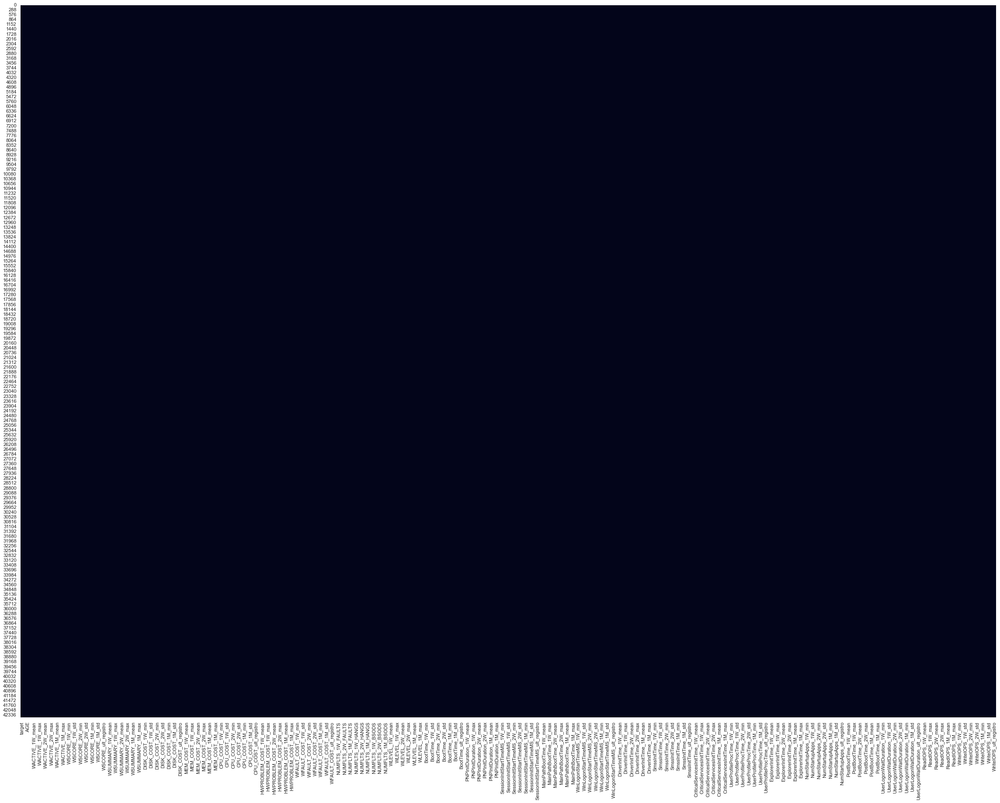

In [ ]:
# Verificamos que no quedan valores null con el gráfico de valores
sns.set(rc = {'figure.figsize':(40, 30)})
sns.heatmap(data.isnull(), cbar=False);

### Gráfico general de outliers en las variables del dataset

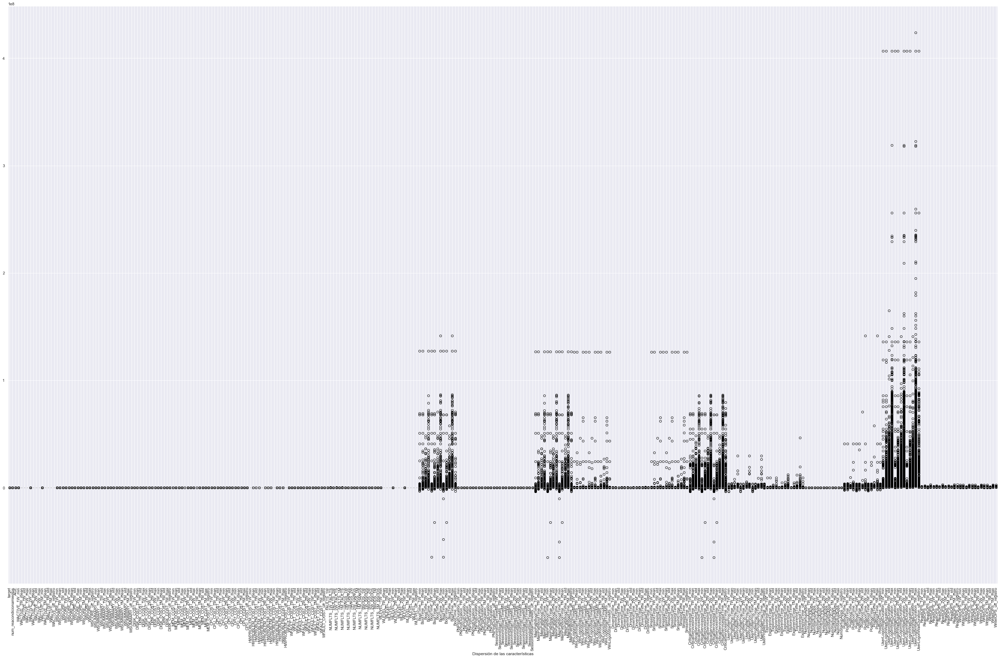

In [ ]:
plt.figure(figsize=(50, 30))
boxplot = data.boxplot(column= data.columns.tolist())
plt.xticks(rotation=90)
plt.xlabel('Dispersión de las características')
boxplot.plot();

### Detección de outliers, gráfico por variable (distribución, cuantiles y cajas).

In [ ]:
# Graficamos outliers

def get_distro(data, col):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.hist(data[col], bins=30)
    plt.title(col)


    plt.subplot(1, 3, 2)
    stats.probplot(data[col], dist='norm', plot=plt)
    plt.title(col)
    plt.xlabel('quantiles')

    plt.subplot(1, 3, 3)
    sns.boxplot(y=data[col])
    plt.title(col)


    plt.show()

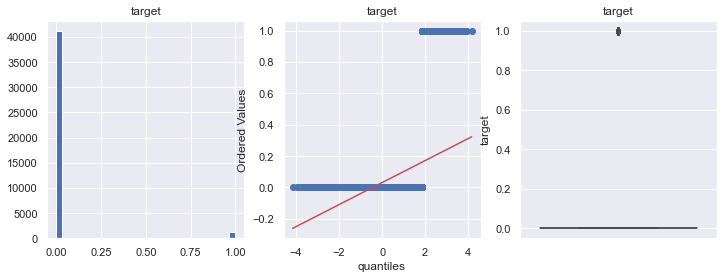

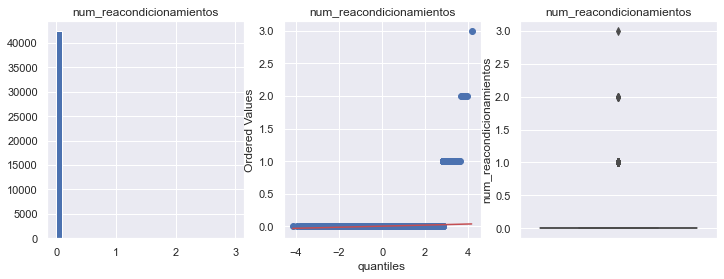

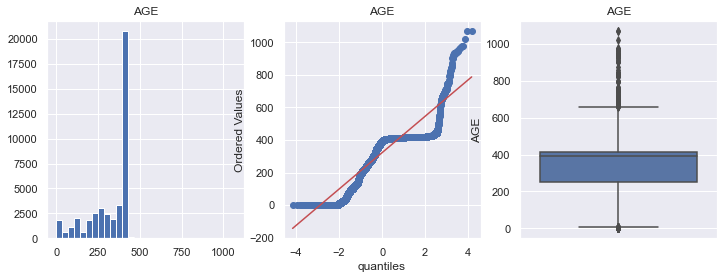

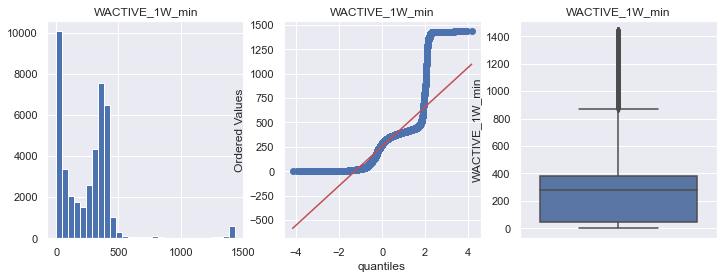

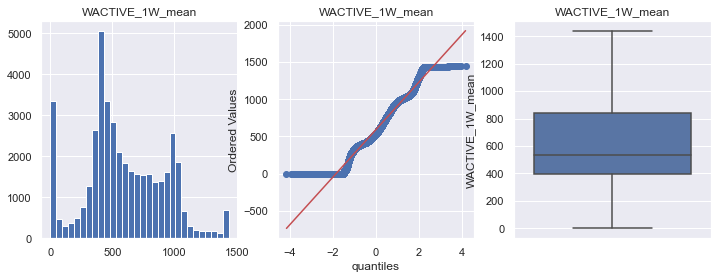

...

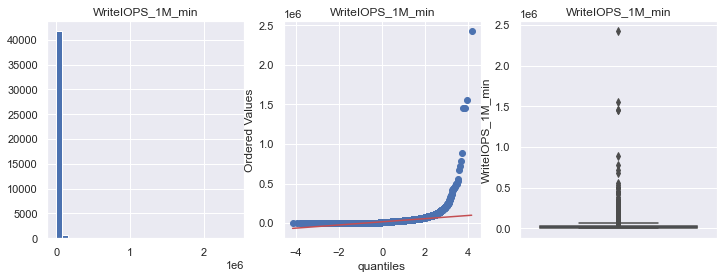

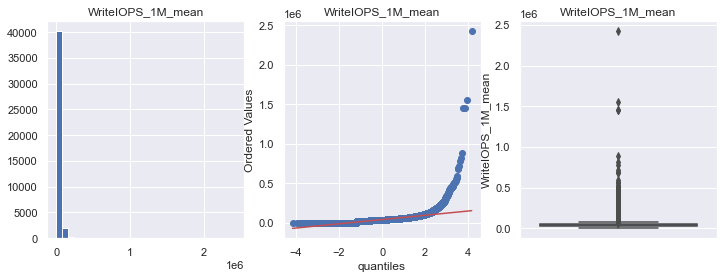

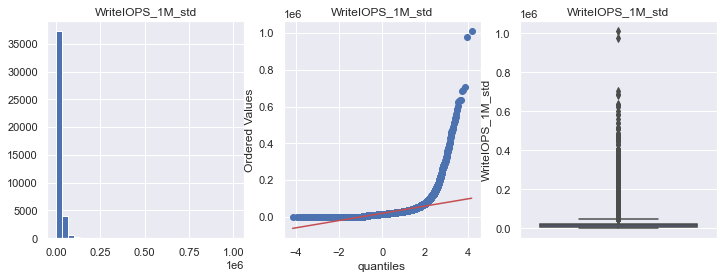

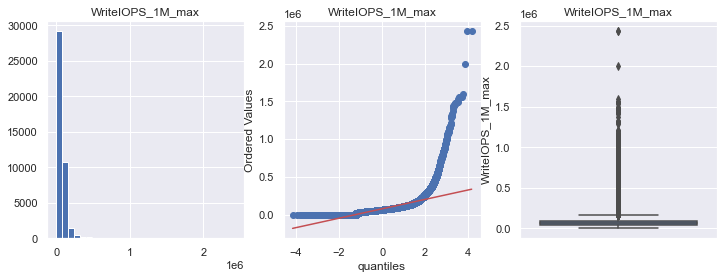

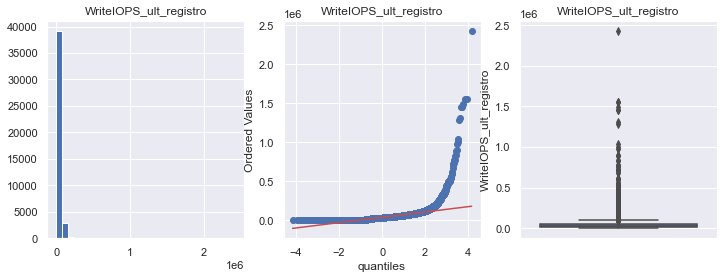

In [ ]:
for col in data.columns:
    get_distro(data, col)

### Tras la detección de outliers, se ha probado a eliminar los outliers, o bien cambiarlos por la media o por la mediana, de los datos que quedan por encima del 90, 95 y 99% del rango de cada característica, siempre y cuando la cantidad de estos no superase el 10% de la cantidad de datos en la característica, con la finalidad de no perder demasiados datos. Y los resultados de las métricas en la ejecución de los modelos, han estado siempre por debajo de los resultados sin la eliminación de outliers. Por lo que se ha decidido mantenerlos en el dataset, deduciendo que su significado estadístico es importante en la calidad de los datos.

### Comprobamos el balanceo de datos

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,6545.116212,290.074772,-79450.551882,inf,0.968793,0.0


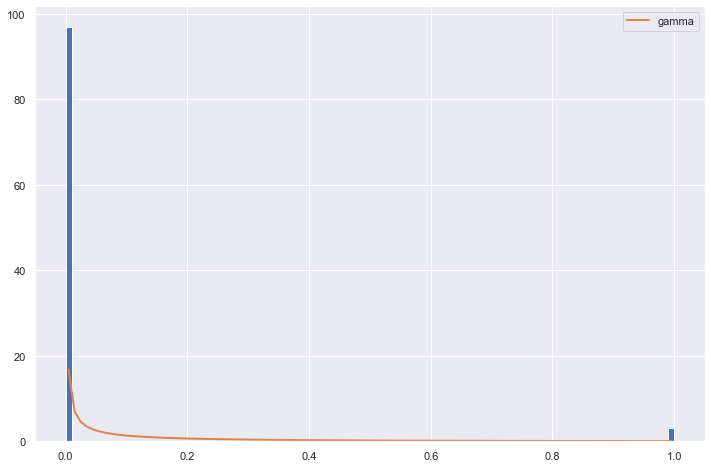

In [ ]:
# Comprobamos la distribución de los datos con el estadístico Gamma
plt.figure(figsize=(12,8))
fitter = Fitter(data.target, distributions='gamma')
fitter.fit()
fitter.summary()

In [ ]:
# Separación de carcaterísticas para el balanceo y visualización de la cantidad de target positiva y negativa
X = data.iloc[:, 1:]
y = data['target']

minority_class = data[data["target"] == 0].count()[0]
mayority_class = data[data["target"] == 1].count()[0]

print(f'La cantidad de datos target negativos es de: {minority_class}')
print(f'La cantidad de datos target positivos es de: {mayority_class}')

La cantidad de datos target negativos es de: 41165
La cantidad de datos target positivos es de: 1326


In [ ]:
# Balanceando los datos con el método resampling de SMOTETomek
smt = SMOTETomek(random_state=42)
X_res, y_res = smt.fit_resample(X, y)
print(f'Nueva estructura del target\nNegativo: {Counter(y_res)[0]}\nPositivo: {Counter(y_res)[1]}')

Nueva estructura del target
Negativo: 41068
Positivo: 41068


### Como podemos observar se ha usado un método de resampling (SMOTETomek), este algoritmo está basado en la combinación de eliminación de instancias redundantes en la clase mayoritaria (valor 0) y posteriormente la aplicación de una técnica de oversampling en la clase minoritaria (valor 1).

In [ ]:
print(f'Eliminación de datos redundantes en la clase mayoritaria (target = 0): {minority_class - Counter(y_res)[0]}')
print(f'Oversampling sobre la clase minoritaria (target = 1): {Counter(y_res)[1] - mayority_class}')

Eliminación de datos redundantes en la clase mayoritaria (target = 0): 97
Oversampling sobre la clase minoritaria (target = 1): 39742


In [ ]:
# Volvemos a colocar los datos X e y en un dataframe despues del balanceo y lo visualizamos
data = pd.DataFrame(data=X_res, columns=data.iloc[:, 1:].columns)
data['target'] = y_res

shape6 = data.shape
print(f'Forma actual del dataset: {shape6}')
data.head()

Forma actual del dataset: (82136, 332)


,AGE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,WSCORE_ult_registro,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,WSUMMARY_ult_registro,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,DISK_COST_ult_registro,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,CPU_COST_ult_registro,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,HWPROBLEM_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEVEL_2W_max,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_std,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1W_min,BootTime_1W_mean,BootTime_1W_std,BootTime_1W_max,BootTime_2W_min,BootTime_2W_mean,BootTime_2W_std,BootTime_2W_max,BootTime_1M_min,BootTime_1M_mean,BootTime_1M_std,BootTime_1M_max,BootTime_ult_registro,PNPInitDuration_1W_min,PNPInitDuration_1W_mean,PNPInitDuration_1W_std,PNPInitDuration_1W_max,PNPInitDuration_2W_min,PNPInitDuration_2W_mean,PNPInitDuration_2W_std,PNPInitDuration_2W_max,PNPInitDuration_1M_min,PNPInitDuration_1M_mean,PNPInitDuration_1M_std,PNPInitDuration_1M_max,PNPInitDuration_ult_registro,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_1W_mean,SessionInitStartTimeMS_1W_std,SessionInitStartTimeMS_1W_max,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_2W_mean,SessionInitStartTimeMS_2W_std,SessionInitStartTimeMS_2W_max,SessionInitStartTimeMS_1M_min,SessionInitStartTimeMS_1M_mean,SessionInitStartTimeMS_1M_std,SessionInitStartTimeMS_1M_max,SessionInitStartTimeMS_ult_registro,MainPathBootTime_1W_min,MainPathBootTime_1W_mean,MainPathBootTime_1W_std,MainPathBootTime_1W_max,MainPathBootTime_2W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_std,MainPathBootTime_2W_max,MainPathBootTime_1M_min,MainPathBootTime_1M_mean,MainPathBootTime_1M_std,MainPathBootTime_1M_max,MainPathBootTime_ult_registro,WinLogonStartTimeMS_1W_min,WinLogonStartTimeMS_1W_mean,WinLogonStartTimeMS_1W_std,WinLogonStartTimeMS_1W_max,WinLogonStartTimeMS_2W_min,WinLogonStartTimeMS_2W_mean,WinLogonStartTimeMS_2W_std,WinLogonStartTimeMS_2W_max,WinLogonStartTimeMS_1M_min,WinLogonStartTimeMS_1M_mean,WinLogonStartTimeMS_1M_std,WinLogonStartTimeMS_1M_max,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_1W_std,DriverInitTime_1W_max,DriverInitTime_2W_min,DriverInitTime_2W_mea

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,4949.785206,84.49517,-230688.722611,inf,0.341399,0.0


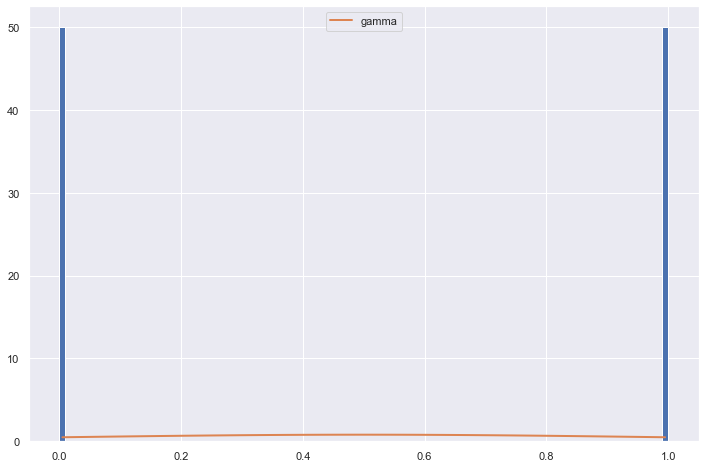

In [ ]:
# Verificamos que el balanceo se ha hecho correctamente
plt.figure(figsize=(12,8))
fitter = Fitter(data.target, distributions='gamma')
fitter.fit()
fitter.summary()

### Observamos la media, desviación estandar y la varianza de los datos antes de normalizarlos.

In [ ]:
# Comprobamos mean, std y var en los datos
print(f'Forma actual del dataset: {data.shape}')
data.aggregate(['mean', 'std', 'var'])

Forma actual del dataset: (82136, 332)


,AGE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,WSCORE_ult_registro,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,WSUMMARY_ult_registro,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,DISK_COST_ult_registro,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,CPU_COST_ult_registro,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,HWPROBLEM_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEVEL_2W_max,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_std,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1W_min,BootTime_1W_mean,BootTime_1W_std,BootTime_1W_max,BootTime_2W_min,BootTime_2W_mean,BootTime_2W_std,BootTime_2W_max,BootTime_1M_min,BootTime_1M_mean,BootTime_1M_std,BootTime_1M_max,BootTime_ult_registro,PNPInitDuration_1W_min,PNPInitDuration_1W_mean,PNPInitDuration_1W_std,PNPInitDuration_1W_max,PNPInitDuration_2W_min,PNPInitDuration_2W_mean,PNPInitDuration_2W_std,PNPInitDuration_2W_max,PNPInitDuration_1M_min,PNPInitDuration_1M_mean,PNPInitDuration_1M_std,PNPInitDuration_1M_max,PNPInitDuration_ult_registro,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_1W_mean,SessionInitStartTimeMS_1W_std,SessionInitStartTimeMS_1W_max,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_2W_mean,SessionInitStartTimeMS_2W_std,SessionInitStartTimeMS_2W_max,SessionInitStartTimeMS_1M_min,SessionInitStartTimeMS_1M_mean,SessionInitStartTimeMS_1M_std,SessionInitStartTimeMS_1M_max,SessionInitStartTimeMS_ult_registro,MainPathBootTime_1W_min,MainPathBootTime_1W_mean,MainPathBootTime_1W_std,MainPathBootTime_1W_max,MainPathBootTime_2W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_std,MainPathBootTime_2W_max,MainPathBootTime_1M_min,MainPathBootTime_1M_mean,MainPathBootTime_1M_std,MainPathBootTime_1M_max,MainPathBootTime_ult_registro,WinLogonStartTimeMS_1W_min,WinLogonStartTimeMS_1W_mean,WinLogonStartTimeMS_1W_std,WinLogonStartTimeMS_1W_max,WinLogonStartTimeMS_2W_min,WinLogonStartTimeMS_2W_mean,WinLogonStartTimeMS_2W_std,WinLogonStartTimeMS_2W_max,WinLogonStartTimeMS_1M_min,WinLogonStartTimeMS_1M_mean,WinLogonStartTimeMS_1M_std,WinLogonStartTimeMS_1M_max,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_1W_std,DriverInitTime_1W_max,DriverInitTime_2W_min,DriverInitTime_2W_mea

In [ ]:
# De haber, quitamos la notación cientifica a los datos para su procesamiento
pd.options.display.float_format = '{:.2f}'.format

### Normalizamos los datos

In [ ]:
# Separación de las carcaterísticas para la normalización
X = data.iloc[:, :-1]
y = data['target']

In [ ]:
# Normalización de datos con StandardScaler de sklearn sin la variable target
scaled = preprocessing.StandardScaler()
scaled_data = scaled.fit_transform(X)
scaled_data = pd.DataFrame(data=scaled_data, columns=data.iloc[:, :-1].columns)

shape7 = scaled_data.shape
print(f'Reducción de columnas: {shape6[1]-shape7[1]}')
print(f'Forma actual del dataset: {shape7}')
scaled_data.head()

Reducción de columnas: 1
Forma actual del dataset: (82136, 331)


,AGE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,WSCORE_ult_registro,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,WSUMMARY_ult_registro,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,DISK_COST_ult_registro,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,CPU_COST_ult_registro,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,HWPROBLEM_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEVEL_2W_max,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_std,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1W_min,BootTime_1W_mean,BootTime_1W_std,BootTime_1W_max,BootTime_2W_min,BootTime_2W_mean,BootTime_2W_std,BootTime_2W_max,BootTime_1M_min,BootTime_1M_mean,BootTime_1M_std,BootTime_1M_max,BootTime_ult_registro,PNPInitDuration_1W_min,PNPInitDuration_1W_mean,PNPInitDuration_1W_std,PNPInitDuration_1W_max,PNPInitDuration_2W_min,PNPInitDuration_2W_mean,PNPInitDuration_2W_std,PNPInitDuration_2W_max,PNPInitDuration_1M_min,PNPInitDuration_1M_mean,PNPInitDuration_1M_std,PNPInitDuration_1M_max,PNPInitDuration_ult_registro,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_1W_mean,SessionInitStartTimeMS_1W_std,SessionInitStartTimeMS_1W_max,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_2W_mean,SessionInitStartTimeMS_2W_std,SessionInitStartTimeMS_2W_max,SessionInitStartTimeMS_1M_min,SessionInitStartTimeMS_1M_mean,SessionInitStartTimeMS_1M_std,SessionInitStartTimeMS_1M_max,SessionInitStartTimeMS_ult_registro,MainPathBootTime_1W_min,MainPathBootTime_1W_mean,MainPathBootTime_1W_std,MainPathBootTime_1W_max,MainPathBootTime_2W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_std,MainPathBootTime_2W_max,MainPathBootTime_1M_min,MainPathBootTime_1M_mean,MainPathBootTime_1M_std,MainPathBootTime_1M_max,MainPathBootTime_ult_registro,WinLogonStartTimeMS_1W_min,WinLogonStartTimeMS_1W_mean,WinLogonStartTimeMS_1W_std,WinLogonStartTimeMS_1W_max,WinLogonStartTimeMS_2W_min,WinLogonStartTimeMS_2W_mean,WinLogonStartTimeMS_2W_std,WinLogonStartTimeMS_2W_max,WinLogonStartTimeMS_1M_min,WinLogonStartTimeMS_1M_mean,WinLogonStartTimeMS_1M_std,WinLogonStartTimeMS_1M_max,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_1W_std,DriverInitTime_1W_max,DriverInitTime_2W_min,DriverInitTime_2W_mea

In [ ]:
# Comprobamos la normalización mean=0, std=1
scaled_data.describe().apply(lambda s: s.apply(lambda x: format(x, 'g')))

,AGE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,WSCORE_ult_registro,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,WSUMMARY_ult_registro,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,DISK_COST_ult_registro,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,CPU_COST_ult_registro,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,HWPROBLEM_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEVEL_2W_max,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_std,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1W_min,BootTime_1W_mean,BootTime_1W_std,BootTime_1W_max,BootTime_2W_min,BootTime_2W_mean,BootTime_2W_std,BootTime_2W_max,BootTime_1M_min,BootTime_1M_mean,BootTime_1M_std,BootTime_1M_max,BootTime_ult_registro,PNPInitDuration_1W_min,PNPInitDuration_1W_mean,PNPInitDuration_1W_std,PNPInitDuration_1W_max,PNPInitDuration_2W_min,PNPInitDuration_2W_mean,PNPInitDuration_2W_std,PNPInitDuration_2W_max,PNPInitDuration_1M_min,PNPInitDuration_1M_mean,PNPInitDuration_1M_std,PNPInitDuration_1M_max,PNPInitDuration_ult_registro,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_1W_mean,SessionInitStartTimeMS_1W_std,SessionInitStartTimeMS_1W_max,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_2W_mean,SessionInitStartTimeMS_2W_std,SessionInitStartTimeMS_2W_max,SessionInitStartTimeMS_1M_min,SessionInitStartTimeMS_1M_mean,SessionInitStartTimeMS_1M_std,SessionInitStartTimeMS_1M_max,SessionInitStartTimeMS_ult_registro,MainPathBootTime_1W_min,MainPathBootTime_1W_mean,MainPathBootTime_1W_std,MainPathBootTime_1W_max,MainPathBootTime_2W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_std,MainPathBootTime_2W_max,MainPathBootTime_1M_min,MainPathBootTime_1M_mean,MainPathBootTime_1M_std,MainPathBootTime_1M_max,MainPathBootTime_ult_registro,WinLogonStartTimeMS_1W_min,WinLogonStartTimeMS_1W_mean,WinLogonStartTimeMS_1W_std,WinLogonStartTimeMS_1W_max,WinLogonStartTimeMS_2W_min,WinLogonStartTimeMS_2W_mean,WinLogonStartTimeMS_2W_std,WinLogonStartTimeMS_2W_max,WinLogonStartTimeMS_1M_min,WinLogonStartTimeMS_1M_mean,WinLogonStartTimeMS_1M_std,WinLogonStartTimeMS_1M_max,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_1W_std,DriverInitTime_1W_max,DriverInitTime_2W_min,DriverInitTime_2W_mea

In [ ]:
# Convertimos los datos escalados en dataframe
scaled_data = pd.DataFrame(scaled_data, columns=data.columns[:-1])
scaled_data.head()

,AGE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,WSCORE_ult_registro,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,WSUMMARY_ult_registro,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,DISK_COST_ult_registro,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,CPU_COST_ult_registro,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,HWPROBLEM_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEVEL_2W_max,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_std,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1W_min,BootTime_1W_mean,BootTime_1W_std,BootTime_1W_max,BootTime_2W_min,BootTime_2W_mean,BootTime_2W_std,BootTime_2W_max,BootTime_1M_min,BootTime_1M_mean,BootTime_1M_std,BootTime_1M_max,BootTime_ult_registro,PNPInitDuration_1W_min,PNPInitDuration_1W_mean,PNPInitDuration_1W_std,PNPInitDuration_1W_max,PNPInitDuration_2W_min,PNPInitDuration_2W_mean,PNPInitDuration_2W_std,PNPInitDuration_2W_max,PNPInitDuration_1M_min,PNPInitDuration_1M_mean,PNPInitDuration_1M_std,PNPInitDuration_1M_max,PNPInitDuration_ult_registro,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_1W_mean,SessionInitStartTimeMS_1W_std,SessionInitStartTimeMS_1W_max,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_2W_mean,SessionInitStartTimeMS_2W_std,SessionInitStartTimeMS_2W_max,SessionInitStartTimeMS_1M_min,SessionInitStartTimeMS_1M_mean,SessionInitStartTimeMS_1M_std,SessionInitStartTimeMS_1M_max,SessionInitStartTimeMS_ult_registro,MainPathBootTime_1W_min,MainPathBootTime_1W_mean,MainPathBootTime_1W_std,MainPathBootTime_1W_max,MainPathBootTime_2W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_std,MainPathBootTime_2W_max,MainPathBootTime_1M_min,MainPathBootTime_1M_mean,MainPathBootTime_1M_std,MainPathBootTime_1M_max,MainPathBootTime_ult_registro,WinLogonStartTimeMS_1W_min,WinLogonStartTimeMS_1W_mean,WinLogonStartTimeMS_1W_std,WinLogonStartTimeMS_1W_max,WinLogonStartTimeMS_2W_min,WinLogonStartTimeMS_2W_mean,WinLogonStartTimeMS_2W_std,WinLogonStartTimeMS_2W_max,WinLogonStartTimeMS_1M_min,WinLogonStartTimeMS_1M_mean,WinLogonStartTimeMS_1M_std,WinLogonStartTimeMS_1M_max,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_1W_std,DriverInitTime_1W_max,DriverInitTime_2W_min,DriverInitTime_2W_mea

In [ ]:
# Añadimos la variable target al dataframe después de separarla para la normalización
scaled_data["target"] = y.values

shape8 = scaled_data.shape
print(f'Aumento de columnas: {shape8[1]-shape7[1]}')
print(f'Forma actual del dataset: {shape8}')
scaled_data.head()

Aumento de columnas: 1
Forma actual del dataset: (82136, 332)


,AGE,WACTIVE_1W_min,WACTIVE_1W_mean,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_mean,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_1W_mean,WSCORE_1W_std,WSCORE_1W_max,WSCORE_2W_min,WSCORE_2W_mean,WSCORE_2W_std,WSCORE_2W_max,WSCORE_1M_min,WSCORE_1M_mean,WSCORE_1M_std,WSCORE_1M_max,WSCORE_ult_registro,WSUMMARY_1W_min,WSUMMARY_1W_mean,WSUMMARY_1W_std,WSUMMARY_1W_max,WSUMMARY_2W_min,WSUMMARY_2W_mean,WSUMMARY_2W_std,WSUMMARY_2W_max,WSUMMARY_1M_min,WSUMMARY_1M_mean,WSUMMARY_1M_std,WSUMMARY_1M_max,WSUMMARY_ult_registro,DISK_COST_1W_min,DISK_COST_1W_mean,DISK_COST_1W_std,DISK_COST_1W_max,DISK_COST_2W_min,DISK_COST_2W_mean,DISK_COST_2W_std,DISK_COST_2W_max,DISK_COST_1M_min,DISK_COST_1M_mean,DISK_COST_1M_std,DISK_COST_1M_max,DISK_COST_ult_registro,MEM_COST_1W_min,MEM_COST_1W_mean,MEM_COST_1W_std,MEM_COST_1W_max,MEM_COST_2W_min,MEM_COST_2W_mean,MEM_COST_2W_std,MEM_COST_2W_max,MEM_COST_1M_min,MEM_COST_1M_mean,MEM_COST_1M_std,MEM_COST_1M_max,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_mean,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_1M_max,CPU_COST_ult_registro,HWPROBLEM_COST_1W_min,HWPROBLEM_COST_1W_mean,HWPROBLEM_COST_1W_std,HWPROBLEM_COST_1W_max,HWPROBLEM_COST_2W_min,HWPROBLEM_COST_2W_mean,HWPROBLEM_COST_2W_std,HWPROBLEM_COST_2W_max,HWPROBLEM_COST_1M_min,HWPROBLEM_COST_1M_mean,HWPROBLEM_COST_1M_std,HWPROBLEM_COST_1M_max,HWPROBLEM_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_min,WFAULT_COST_2W_mean,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_mean,WFAULT_COST_1M_std,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,NUMFLTS_1W_FAULTS,FAULTS_2W,NUMFLTS_2W_FAULTS,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,NUMFLTS_1W_HANGS,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,NUMFLTS_1M_HANGS,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,NUMFLTS_1M_BSODS,WLEVEL_1W_min,WLEVEL_1W_mean,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_mean,WLEVEL_2W_std,WLEVEL_2W_max,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_std,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1W_min,BootTime_1W_mean,BootTime_1W_std,BootTime_1W_max,BootTime_2W_min,BootTime_2W_mean,BootTime_2W_std,BootTime_2W_max,BootTime_1M_min,BootTime_1M_mean,BootTime_1M_std,BootTime_1M_max,BootTime_ult_registro,PNPInitDuration_1W_min,PNPInitDuration_1W_mean,PNPInitDuration_1W_std,PNPInitDuration_1W_max,PNPInitDuration_2W_min,PNPInitDuration_2W_mean,PNPInitDuration_2W_std,PNPInitDuration_2W_max,PNPInitDuration_1M_min,PNPInitDuration_1M_mean,PNPInitDuration_1M_std,PNPInitDuration_1M_max,PNPInitDuration_ult_registro,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_1W_mean,SessionInitStartTimeMS_1W_std,SessionInitStartTimeMS_1W_max,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_2W_mean,SessionInitStartTimeMS_2W_std,SessionInitStartTimeMS_2W_max,SessionInitStartTimeMS_1M_min,SessionInitStartTimeMS_1M_mean,SessionInitStartTimeMS_1M_std,SessionInitStartTimeMS_1M_max,SessionInitStartTimeMS_ult_registro,MainPathBootTime_1W_min,MainPathBootTime_1W_mean,MainPathBootTime_1W_std,MainPathBootTime_1W_max,MainPathBootTime_2W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_std,MainPathBootTime_2W_max,MainPathBootTime_1M_min,MainPathBootTime_1M_mean,MainPathBootTime_1M_std,MainPathBootTime_1M_max,MainPathBootTime_ult_registro,WinLogonStartTimeMS_1W_min,WinLogonStartTimeMS_1W_mean,WinLogonStartTimeMS_1W_std,WinLogonStartTimeMS_1W_max,WinLogonStartTimeMS_2W_min,WinLogonStartTimeMS_2W_mean,WinLogonStartTimeMS_2W_std,WinLogonStartTimeMS_2W_max,WinLogonStartTimeMS_1M_min,WinLogonStartTimeMS_1M_mean,WinLogonStartTimeMS_1M_std,WinLogonStartTimeMS_1M_max,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_1W_std,DriverInitTime_1W_max,DriverInitTime_2W_min,DriverInitTime_2W_mea

### A partir de aquí, implementaremos el modelo XGBRegressor como método de Recursive Feature ELimination, con cross validation (cv=4), para ir eliminando características hasta quedarnos con las más significativas, que determinaremos en 1 nivel de importancia (profundidad), lo cual nos arroja 145 columnas como más significativas.

### Características relevantes del dataset con Recursive Feature Elimination (Cross Validation)

In [ ]:
# Despliegue de las características relevantes del dataset (featuring importance)
model = XGBRegressor(objective='reg:squarederror')
selector = RFECV(model, step=3, min_features_to_select=3, cv=4)
X_features = X.drop('AGE', axis=1)  # Eliminamos la variable AGE
selector.fit(X_features, y)

print(f'Lista de variables:\n{X_features.columns.tolist()}')
print()
print(f'Ranking de importancia según la variable:\n{selector.ranking_}')

Lista de variables:
['WACTIVE_1W_min', 'WACTIVE_1W_mean', 'WACTIVE_1W_std', 'WACTIVE_1W_max', 'WACTIVE_2W_min', 'WACTIVE_2W_mean', 'WACTIVE_2W_std', 'WACTIVE_2W_max', 'WACTIVE_1M_min', 'WACTIVE_1M_mean', 'WACTIVE_1M_std', 'WACTIVE_1M_max', 'WACTIVE_ult_registro', 'WSCORE_1W_min', 'WSCORE_1W_mean', 'WSCORE_1W_std', 'WSCORE_1W_max', 'WSCORE_2W_min', 'WSCORE_2W_mean', 'WSCORE_2W_std', 'WSCORE_2W_max', 'WSCORE_1M_min', 'WSCORE_1M_mean', 'WSCORE_1M_std', 'WSCORE_1M_max', 'WSCORE_ult_registro', 'WSUMMARY_1W_min', 'WSUMMARY_1W_mean', 'WSUMMARY_1W_std', 'WSUMMARY_1W_max', 'WSUMMARY_2W_min', 'WSUMMARY_2W_mean', 'WSUMMARY_2W_std', 'WSUMMARY_2W_max', 'WSUMMARY_1M_min', 'WSUMMARY_1M_mean', 'WSUMMARY_1M_std', 'WSUMMARY_1M_max', 'WSUMMARY_ult_registro', 'DISK_COST_1W_min', 'DISK_COST_1W_mean', 'DISK_COST_1W_std', 'DISK_COST_1W_max', 'DISK_COST_2W_min', 'DISK_COST_2W_mean', 'DISK_COST_2W_std', 'DISK_COST_2W_max', 'DISK_COST_1M_min', 'DISK_COST_1M_mean', 'DISK_COST_1M_std', 'DISK_COST_1M_max', 'DISK_C

### Hemos comprobado en varias pruebas que la variable AGE mantiene un peso correlacional alto con el resto de variables, lo cual limita la importancia del resto y condiciona su selección como variables relevantes restando importancia al resto. Estas pruebas se han llevado a cabo observando la respuesta de los modelos con y sin variable AGE. Se llegó a la conclusión de que esto podía ser así teniendo en cuenta que la característica 'tiempo' puede afectar de manera habitual al cambio de la máquina y se comprobó que, en este caso su efecto estadístico perjudica a los resultados sobre el resto de variables disminuyendo su peso estadístico.

In [ ]:
# Unimos los valores de la lista de columnas y la de rankings en un diccionario
rankings_col = dict(zip(X_features.columns.tolist(), selector.ranking_))
print(f'Diccionario de variables con su puntuación en el ranking de importancia:\n\n{rankings_col}')

Diccionario de variables con su puntuación en el ranking de importancia:

{'WACTIVE_1W_min': 1, 'WACTIVE_1W_mean': 56, 'WACTIVE_1W_std': 1, 'WACTIVE_1W_max': 1, 'WACTIVE_2W_min': 1, 'WACTIVE_2W_mean': 5, 'WACTIVE_2W_std': 1, 'WACTIVE_2W_max': 1, 'WACTIVE_1M_min': 1, 'WACTIVE_1M_mean': 1, 'WACTIVE_1M_std': 1, 'WACTIVE_1M_max': 1, 'WACTIVE_ult_registro': 1, 'WSCORE_1W_min': 1, 'WSCORE_1W_mean': 56, 'WSCORE_1W_std': 18, 'WSCORE_1W_max': 52, 'WSCORE_2W_min': 1, 'WSCORE_2W_mean': 42, 'WSCORE_2W_std': 46, 'WSCORE_2W_max': 1, 'WSCORE_1M_min': 30, 'WSCORE_1M_mean': 1, 'WSCORE_1M_std': 48, 'WSCORE_1M_max': 1, 'WSCORE_ult_registro': 18, 'WSUMMARY_1W_min': 1, 'WSUMMARY_1W_mean': 41, 'WSUMMARY_1W_std': 1, 'WSUMMARY_1W_max': 32, 'WSUMMARY_2W_min': 23, 'WSUMMARY_2W_mean': 28, 'WSUMMARY_2W_std': 33, 'WSUMMARY_2W_max': 12, 'WSUMMARY_1M_min': 1, 'WSUMMARY_1M_mean': 29, 'WSUMMARY_1M_std': 25, 'WSUMMARY_1M_max': 4, 'WSUMMARY_ult_registro': 11, 'DISK_COST_1W_min': 1, 'DISK_COST_1W_mean': 13, 'DISK_COST_1W

In [ ]:
# Se extraen del dataframe original los datos de las columnas consideradas más importantes en el modelo XGBRegressor, unimos la variable target y se genera un dataframe.
ranking_list = []

for key, value in rankings_col.items():
  if value == 1:
    ranking_list.append(key)

ranking_df = pd.DataFrame(data, columns=ranking_list)
ranking_df["target"] = y.values

shape9 = ranking_df.shape
print(f'Reducción de columnas: {shape8[1]-shape9[1]}')
print(f'Forma actual del dataset: {shape9}')
ranking_df.head()

Reducción de columnas: 187
Forma actual del dataset: (82136, 145)


,WACTIVE_1W_min,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_2W_min,WSCORE_2W_max,WSCORE_1M_mean,WSCORE_1M_max,WSUMMARY_1W_min,WSUMMARY_1W_std,WSUMMARY_1M_min,DISK_COST_1W_min,DISK_COST_1W_std,DISK_COST_2W_min,DISK_COST_1M_min,DISK_COST_1M_mean,MEM_COST_1W_mean,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,FAULTS_2W,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,WLEVEL_1W_min,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_std,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1M_max,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_1M_min,MainPathBootTime_1W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_max,MainPathBootTime_1M_min,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_2W_max,DriverInitTime_1M_min,DriverInitTime_1M_mean,DriverInitTime_1M_max,SmssInitTime_1W_mean,SmssInitTime_1W_max,SmssInitTime_1M_min,SmssInitTime_1M_std,SmssInitTime_ult_registro,CriticalServicesInitTime_1W_std,CriticalServicesInitTime_2W_mean,CriticalServicesInitTime_1M_min,CriticalServicesInitTime_1M_mean,CriticalServicesInitTime_1M_std,CriticalServicesInitTime_ult_registro,UserProfileProcTime_1W_min,UserProfileProcTime_1W_std,UserProfileProcTime_2W_mean,UserProfileProcTime_1M_min,UserProfileProcTime_1M_mean,UserProfileProcTime_1M_std,UserProfileProcTime_1M_max,UserProfileProcTime_ult_registro,ExplorerInitTime_1W_mean,ExplorerInitTime_2W_min,ExplorerInitTime_2W_mean,ExplorerInitTime_1M_min,ExplorerInitTime_1M_mean,ExplorerInitTime_1M_max,ExplorerInitTime_ult_registro,NumStartupApps_1W_min,NumStartupApps_1W_mean,NumStartupApps_1W_std,NumStartupApps_1W_max,NumStartupApps_2W_max,NumStartupApps_1M_min,NumStartupApps_1M_mean,NumStartupApps_1M_std,NumStartupApps_1M_max,NumStartupApps_ult_registro,PostBootTime_2W_min,PostBootTime_2W_mean,PostBootTime_1M_min,PostBootTime_1M_mean,PostBootTime_ult_registro,UserLogonWaitDuration_2W_min,UserLogonWaitDuration_2W_mean,UserLogonWaitDuration_2W_std,UserLogonWaitDuration_2W_max,UserLogonWaitDuration_1M_mean,UserLogonWaitDuration_1M_std,UserLogonWaitDuration_1M_max,ReadIOPS_1W_mean,ReadIOPS_1W_std,ReadIOPS_2W_min,ReadIOPS_2W_mean,ReadIOPS_1M_min,ReadIOPS_1M_mean,ReadIOPS_1M_std,ReadIOPS_ult_registro,WriteIOPS_1W_min,WriteIOPS_1W_mean,WriteIOPS_2W_mean,WriteIOPS_1M_min,WriteIOPS_1M_mean,target
0,250.00,536.33,1430.00,230.00,525.48,1430.00,230.00,1023.15,506.48,1440.00,1420.00,60.40,60.40,99.67,75.79,99.67,5.00,76.64,3.00,0.00,17.47,0.00,0.00,27.24,0.00,0.00,2.00,49.87,152.33,0.00,87.09,54.94,152.33,0.00,161.25,169.47,138.00,0.00,0.10,0.30,1.00,0.27,1.00,0.00,3.33,0.00,1.00,1.00,7.00,7.00,1.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,510000.00,0.00,0.00,0.00,275000.00,153000.00,275000.00,31000.00,17000.00,8000.00,8000.00,8000.00,8000.00,8000.00,8000.00,9000.00,9000.00,5000.00,2828.43,9000.00,0.00,134000.00,18000.00,134000.00,164048.77,250000.00,10000.00,0.00,5500.00,1000.00,5500.00,6363.96,10000.00,10000.00,8000.00,0.00,4000.00,0.00,4000.00,8000.00,8000.00,1.00,1.00,0.00,1.00,17.00,1.00,9.00,11.31,17.00,1.00,235000.00,272500.00,235000.00,272500.00,235000.00,69000.00,86500.00,24748.74,104000.00,86500.00,24748.74,104000.00,0.00,0.00,0.00,77572.50,0.00,77572.50,109704.08,0.00,0.00,0.00,12426.00,0.00,12426.00,0
1,1410.00,11.55,1440.00,1410.00,9.14,1440.00,1410.00,1435.17,7.38,1440.00,1420.00,99.93,99.44,100.00,99.95,10

## Cargar dataset procesado

In [ ]:
# Guardamos del dataframe con la selección de carcaterísticas en un csv
ranking_df.to_csv('caracteristicas_relevantes.csv', sep=';')

In [ ]:
# Visualizamos la forma del nuevo dataset con las características seleccionadas
shape10 = ranking_df.shape
print(f'Forma actual del dataset: {shape10}')
ranking_df.head()

Forma actual del dataset: (82136, 145)


,WACTIVE_1W_min,WACTIVE_1W_std,WACTIVE_1W_max,WACTIVE_2W_min,WACTIVE_2W_std,WACTIVE_2W_max,WACTIVE_1M_min,WACTIVE_1M_mean,WACTIVE_1M_std,WACTIVE_1M_max,WACTIVE_ult_registro,WSCORE_1W_min,WSCORE_2W_min,WSCORE_2W_max,WSCORE_1M_mean,WSCORE_1M_max,WSUMMARY_1W_min,WSUMMARY_1W_std,WSUMMARY_1M_min,DISK_COST_1W_min,DISK_COST_1W_std,DISK_COST_2W_min,DISK_COST_1M_min,DISK_COST_1M_mean,MEM_COST_1W_mean,MEM_COST_ult_registro,CPU_COST_1W_min,CPU_COST_1W_std,CPU_COST_1W_max,CPU_COST_2W_min,CPU_COST_2W_mean,CPU_COST_2W_std,CPU_COST_2W_max,CPU_COST_1M_min,CPU_COST_1M_mean,CPU_COST_1M_std,CPU_COST_ult_registro,WFAULT_COST_1W_min,WFAULT_COST_1W_mean,WFAULT_COST_1W_std,WFAULT_COST_1W_max,WFAULT_COST_2W_std,WFAULT_COST_2W_max,WFAULT_COST_1M_min,WFAULT_COST_1M_max,WFAULT_COST_ult_registro,FAULTS_1W,FAULTS_2W,FAULTS_1M,NUMFLTS_1M_FAULTS,HANGS_1W,HANGS_2W,NUMFLTS_2W_HANGS,HANGS_1M,BSODS_1W,NUMFLTS_1W_BSODS,BSODS_2W,NUMFLTS_2W_BSODS,BSODS_1M,WLEVEL_1W_min,WLEVEL_1W_std,WLEVEL_1W_max,WLEVEL_2W_min,WLEVEL_2W_std,WLEVEL_1M_min,WLEVEL_1M_mean,WLEVEL_1M_max,WLEVEL_ult_registro,BootTime_1M_max,SessionInitStartTimeMS_1W_min,SessionInitStartTimeMS_2W_min,SessionInitStartTimeMS_1M_min,MainPathBootTime_1W_min,MainPathBootTime_2W_mean,MainPathBootTime_2W_max,MainPathBootTime_1M_min,WinLogonStartTimeMS_ult_registro,DriverInitTime_1W_min,DriverInitTime_1W_mean,DriverInitTime_2W_max,DriverInitTime_1M_min,DriverInitTime_1M_mean,DriverInitTime_1M_max,SmssInitTime_1W_mean,SmssInitTime_1W_max,SmssInitTime_1M_min,SmssInitTime_1M_std,SmssInitTime_ult_registro,CriticalServicesInitTime_1W_std,CriticalServicesInitTime_2W_mean,CriticalServicesInitTime_1M_min,CriticalServicesInitTime_1M_mean,CriticalServicesInitTime_1M_std,CriticalServicesInitTime_ult_registro,UserProfileProcTime_1W_min,UserProfileProcTime_1W_std,UserProfileProcTime_2W_mean,UserProfileProcTime_1M_min,UserProfileProcTime_1M_mean,UserProfileProcTime_1M_std,UserProfileProcTime_1M_max,UserProfileProcTime_ult_registro,ExplorerInitTime_1W_mean,ExplorerInitTime_2W_min,ExplorerInitTime_2W_mean,ExplorerInitTime_1M_min,ExplorerInitTime_1M_mean,ExplorerInitTime_1M_max,ExplorerInitTime_ult_registro,NumStartupApps_1W_min,NumStartupApps_1W_mean,NumStartupApps_1W_std,NumStartupApps_1W_max,NumStartupApps_2W_max,NumStartupApps_1M_min,NumStartupApps_1M_mean,NumStartupApps_1M_std,NumStartupApps_1M_max,NumStartupApps_ult_registro,PostBootTime_2W_min,PostBootTime_2W_mean,PostBootTime_1M_min,PostBootTime_1M_mean,PostBootTime_ult_registro,UserLogonWaitDuration_2W_min,UserLogonWaitDuration_2W_mean,UserLogonWaitDuration_2W_std,UserLogonWaitDuration_2W_max,UserLogonWaitDuration_1M_mean,UserLogonWaitDuration_1M_std,UserLogonWaitDuration_1M_max,ReadIOPS_1W_mean,ReadIOPS_1W_std,ReadIOPS_2W_min,ReadIOPS_2W_mean,ReadIOPS_1M_min,ReadIOPS_1M_mean,ReadIOPS_1M_std,ReadIOPS_ult_registro,WriteIOPS_1W_min,WriteIOPS_1W_mean,WriteIOPS_2W_mean,WriteIOPS_1M_min,WriteIOPS_1M_mean,target
0,250.00,536.33,1430.00,230.00,525.48,1430.00,230.00,1023.15,506.48,1440.00,1420.00,60.40,60.40,99.67,75.79,99.67,5.00,76.64,3.00,0.00,17.47,0.00,0.00,27.24,0.00,0.00,2.00,49.87,152.33,0.00,87.09,54.94,152.33,0.00,161.25,169.47,138.00,0.00,0.10,0.30,1.00,0.27,1.00,0.00,3.33,0.00,1.00,1.00,7.00,7.00,1.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,510000.00,0.00,0.00,0.00,275000.00,153000.00,275000.00,31000.00,17000.00,8000.00,8000.00,8000.00,8000.00,8000.00,8000.00,9000.00,9000.00,5000.00,2828.43,9000.00,0.00,134000.00,18000.00,134000.00,164048.77,250000.00,10000.00,0.00,5500.00,1000.00,5500.00,6363.96,10000.00,10000.00,8000.00,0.00,4000.00,0.00,4000.00,8000.00,8000.00,1.00,1.00,0.00,1.00,17.00,1.00,9.00,11.31,17.00,1.00,235000.00,272500.00,235000.00,272500.00,235000.00,69000.00,86500.00,24748.74,104000.00,86500.00,24748.74,104000.00,0.00,0.00,0.00,77572.50,0.00,77572.50,109704.08,0.00,0.00,0.00,12426.00,0.00,12426.00,0
1,1410.00,11.55,1440.00,1410.00,9.14,1440.00,1410.00,1435.17,7.38,1440.00,1420.00,99.93,99.44,100.00,99.95,10

## Separación de train y test

In [ ]:
# Separación de las carcaterísticas de la variable target
X = ranking_df.iloc[:, :-1]
y = ranking_df['target']

In [ ]:
# Separación de train y test
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    train_size=0.70,
    test_size=0.30,
    random_state=42,
    shuffle=True)

# MODELADO

## Logistic Regression

In [ ]:
# Parámetros
p_c = [0.01, 0.05, 0.25, 0.5, 1, 10]
p_solver = 'lbfgs'
p_max_iter = 1000
p_random_state = 42

In [ ]:
# preparación de listas para métricas en train y test
train_accuracy = list()
test_accuracy = list()

In [ ]:
for c in p_c:

    # Entrenamiento
    clf_lr = LogisticRegression(C=c, solver=p_solver, max_iter=p_max_iter, random_state=p_random_state)
    clf_lr.fit(X_train, y_train)

    y_pred_train = clf_lr.predict(X_train)
    y_pred_test = clf_lr.predict(X_test)

    scr_train = clf_lr.score(X_train, y_train)
    scr_test = clf_lr.score(X_test, y_test)

    train_accuracy.append(scr_train)
    test_accuracy.append(scr_test)

    print("C = ", c)
    print(f'Train accuracy : {scr_train * 100:.6f} %')
    print(f'Test accuracy : {scr_test * 100:.6f} %')

c:\Users\psyco\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


C =  0.01
Train accuracy : 68.635534 %
Test accuracy : 68.601112 %


c:\Users\psyco\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


C =  0.05
Train accuracy : 68.694669 %
Test accuracy : 68.743152 %


c:\Users\psyco\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


C =  0.25
Train accuracy : 68.619880 %
Test accuracy : 68.394140 %


c:\Users\psyco\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


C =  0.5
Train accuracy : 68.771197 %
Test accuracy : 68.779676 %


c:\Users\psyco\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


C =  1
Train accuracy : 68.811201 %
Test accuracy : 68.791851 %
C =  10
Train accuracy : 68.759023 %
Test accuracy : 68.536180 %


c:\Users\psyco\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


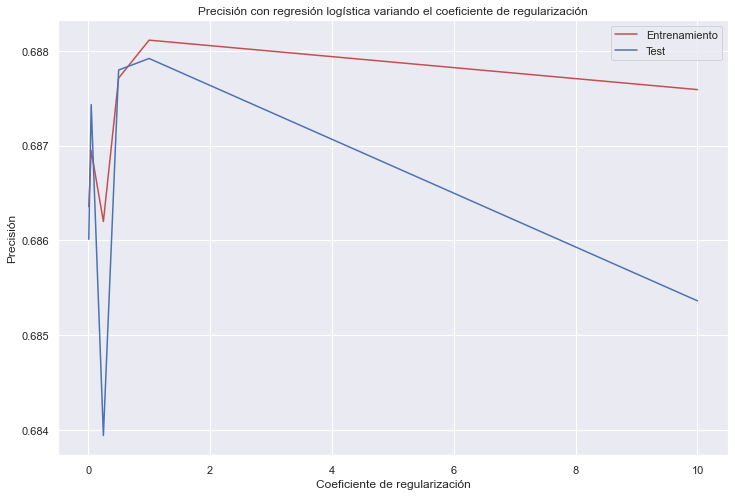

In [ ]:
# graficar los resultados.
plt.figure(figsize=(12, 8))
plt.plot(p_c, train_accuracy, color='r', label='Entrenamiento')
plt.plot(p_c, test_accuracy, color='b', label='Test')
plt.title('Precisión con regresión logística variando el coeficiente de regularización')
plt.legend()
plt.ylabel('Precisión')
plt.xlabel('Coeficiente de regularización')
plt.show()

In [ ]:
# Se calcula con el mejor parámetro
clf_lr = LogisticRegression(C=0.01, solver=p_solver, max_iter=p_max_iter)
clf_lr.fit(X_train, y_train)

y_pred_test = clf_lr.predict(X_test)

m_accuracy = metrics.accuracy_score(y_test, y_pred_test)
m_precision = metrics.precision_score(y_test, y_pred_test)
m_recall = metrics.recall_score(y_test, y_pred_test)
m_f1 = metrics.f1_score(y_test, y_pred_test)

print(f'Accuracy : {m_accuracy * 100:.6f} %')
print(f'Precision : {m_precision * 100:.6f} %')
print(f'Recall : {m_recall * 100:.6f} %')
print(f'F1-Score : {m_f1 * 100:.6f} %')

Accuracy : 68.601112 %
Precision : 70.697927 %
Recall : 63.444354 %
F1-Score : 66.875027 %


c:\Users\psyco\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred_test)
class_report_RF = classification_report(y_test, y_pred_test)
print(class_report_RF)
print(cm)

              precision    recall  f1-score   support

           0       0.67      0.74      0.70     12331
           1       0.71      0.63      0.67     12310

    accuracy                           0.69     24641
   macro avg       0.69      0.69      0.69     24641
weighted avg       0.69      0.69      0.69     24641

[[9094 3237]
 [4500 7810]]


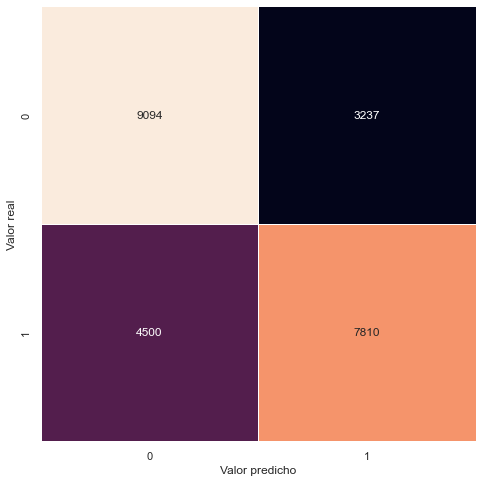

In [ ]:
# Gráfico de la matriz de confusión
sns.set(rc={'figure.figsize':(12, 8)})
sns.heatmap(cm, square=True, annot=True, cbar=False, fmt="d", linewidths=.5)
plt.xlabel('Valor predicho')
plt.ylabel('Valor real');

In [ ]:
# Información para registro en mlflow
l_clasificadores.append("Logistic Regression")
l_parametros.append([["C", 1], ["Solver", p_solver], ["max_iter", p_max_iter], ["random_state", p_random_state]])
l_metrica_accuracy.append(m_accuracy)
l_metrica_precision.append(m_precision)
l_metrica_recall.append(m_recall)
l_metrica_f1.append(m_f1)
l_modelos.append(clf_lr)

## Decision Tree

In [ ]:
# Parámetros
p_random_state = 42
p_criterion = 'entropy'
p_max_deep_list = list(range(3, 15))

In [ ]:
# Visualización de métricas variando el parámetro de profundidad en el árbol de decisión
train_accuracy =  []
test_accuracy = []

for deep in p_max_deep_list:
    clf_dt = DecisionTreeClassifier(criterion='entropy', max_depth=deep)
    clf_dt.fit(X_train, y_train)

    scr_train = clf_dt.score(X_train, y_train)
    scr_test = clf_dt.score(X_test, y_test)

    train_accuracy.append(scr_train)
    test_accuracy.append(scr_test)

    print("MAX DEPTH", deep)
    print(scr_train)
    print(scr_test)

MAX DEPTH 3
0.7873728150273936
0.7885637758207865
MAX DEPTH 4
0.8012348899904339
0.7959904224666207
MAX DEPTH 5
0.83337681537525
0.827726147477781
MAX DEPTH 6
0.8435516131837552
0.839454567590601
MAX DEPTH 7
0.868788590312201
0.8601517795544013
MAX DEPTH 8
0.8816244890860074
0.8719207824357778
MAX DEPTH 9
0.9020262631533177
0.8862870825047685
MAX DEPTH 10
0.9171927993738586
0.8976502577005804
MAX DEPTH 11
0.9322723715105662
0.9057262286433181
MAX DEPTH 12
0.9446212714149056
0.9109208230185464
MAX DEPTH 13
0.9535437864162101
0.9151414309484193
MAX DEPTH 14
0.9603095921384468
0.9182257213587111


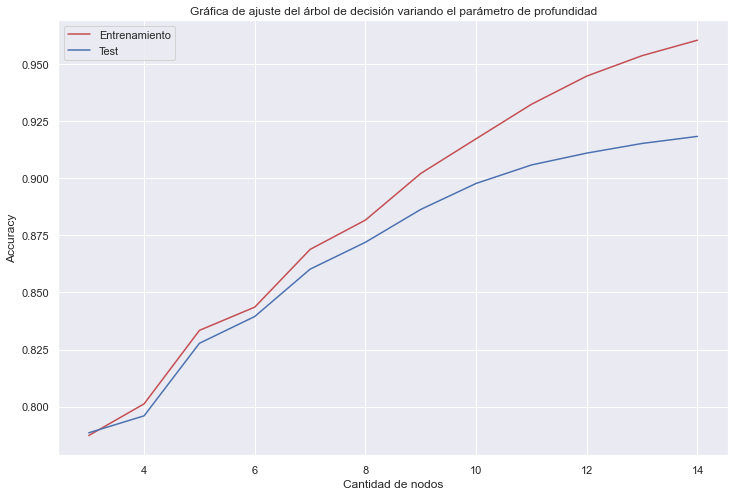

In [ ]:
# graficar los resultados de train y test.
plt.figure(figsize=(12, 8))
plt.plot(p_max_deep_list, train_accuracy, color='r', label='Entrenamiento')
plt.plot(p_max_deep_list, test_accuracy, color='b', label='Test')
plt.title('Gráfica de ajuste del árbol de decisión variando el parámetro de profundidad')
plt.legend()
plt.ylabel('Accuracy')
plt.xlabel('Cantidad de nodos')
plt.show()

In [ ]:
# Entrenamiento
clf_dt = DecisionTreeClassifier(random_state=p_random_state, criterion=p_criterion, max_depth=12)
clf_dt.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=12, random_state=42)

In [ ]:
# Predicción
y_pred_test = clf_dt.predict(X_test)


In [ ]:
# Métricas
m_accuracy = metrics.accuracy_score(y_test, y_pred_test)
m_precision = metrics.precision_score(y_test, y_pred_test)
m_recall = metrics.recall_score(y_test, y_pred_test)
m_f1 = metrics.f1_score(y_test, y_pred_test)

print(f'Accuracy : {m_accuracy * 100:.6f} %')
print(f'Precisión : {m_precision * 100:.6f} %')
print(f'Recall : {m_recall * 100:.6f} %')
print(f'F1-Score : {m_f1 * 100:.6f} %')

Accuracy : 91.079907 %
Precisión : 92.731575 %
Recall : 89.130788 %
F1-Score : 90.895535 %


In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred_test)
class_report_RF = classification_report(y_test, y_pred_test)
print(class_report_RF)
print(cm)

              precision    recall  f1-score   support

           0       0.90      0.93      0.91     12331
           1       0.93      0.89      0.91     12310

    accuracy                           0.91     24641
   macro avg       0.91      0.91      0.91     24641
weighted avg       0.91      0.91      0.91     24641

[[11471   860]
 [ 1338 10972]]


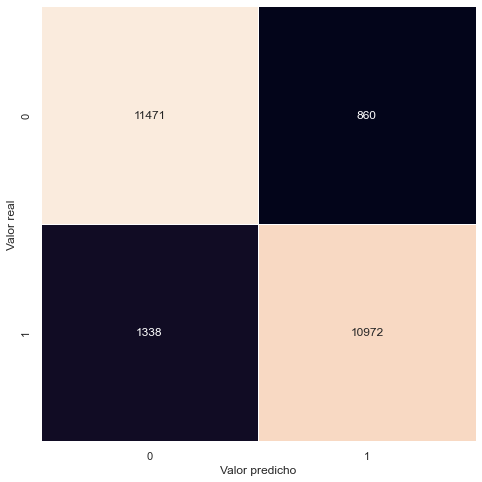

In [ ]:
# Gráfico de la matriz de confusión
sns.set(rc={'figure.figsize':(12, 8)})
sns.heatmap(cm, square=True, annot=True, cbar=False, fmt="d", linewidths=.5)
plt.xlabel('Valor predicho')
plt.ylabel('Valor real');

In [ ]:
# Información para registro en mlflow
l_clasificadores.append("Decision Tree")
l_parametros.append([["random_state", p_random_state], ["criterion", p_criterion], ["max_deep", 12]])
l_metrica_accuracy.append(m_accuracy)
l_metrica_precision.append(m_precision)
l_metrica_recall.append(m_recall)
l_metrica_f1.append(m_f1)
l_modelos.append(clf_dt)


## Random Forest

In [ ]:
# Configuración de parámetros
parameters = {
      'n_estimators': [10, 50, 100, 150, 200],
      'criterion': ["gini"],
      'max_features': ["auto"],
      'max_depth':[3, 5, 7, 9, 11, 15],
      'max_leaf_nodes': [2, 4, 6, 8, 10]
      }

In [ ]:
# Parámetros configurables del algoritmo
RandomForestClassifier().get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [ ]:
# Modelo
clf_rf = RandomForestClassifier(random_state=42)

In [ ]:
# Búsqueda exhaustiva para encontrar los mejores parámetros para el estimador Random Forest
clf = GridSearchCV(estimator=clf_rf, param_grid=parameters, n_jobs=5)

In [ ]:
# Entrenamiento
clf.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestClassifier(random_state=42), n_jobs=5,
             param_grid={'criterion': ['gini'],
                         'max_depth': [3, 5, 7, 9, 11, 15],
                         'max_features': ['auto'],
                         'max_leaf_nodes': [2, 4, 6, 8, 10],
                         'n_estimators': [10, 50, 100, 150, 200]})

In [ ]:
# Obtención de los mejores parámetros
clf.best_params_

{'criterion': 'gini',
 'max_depth': 7,
 'max_features': 'auto',
 'max_leaf_nodes': 10,
 'n_estimators': 10}

In [ ]:
# Parámetros
p_criterion = clf.best_params_["criterion"]
p_max_depth = clf.best_params_["max_depth"]
p_max_features = clf.best_params_["max_features"]
p_max_leaf_nodes = clf.best_params_["max_leaf_nodes"]
p_estimators = clf.best_params_["n_estimators"]
p_random_state = 42

In [ ]:
# Predicción
y_pred_test = clf.predict(X_test)


In [ ]:
# Metricas de precisión y recall
m_accuracy = metrics.accuracy_score(y_test, y_pred_test)
m_precision = metrics.precision_score(y_test, y_pred_test)
m_recall = metrics.recall_score(y_test, y_pred_test)
m_f1 = metrics.f1_score(y_test, y_pred_test)

print(f'Accuracy : {m_accuracy * 100:.6f} %')
print(f'Precisión : {m_precision * 100:.6f} %')
print(f'Recall : {m_recall * 100:.6f} %')
print(f'F1-Score : {m_f1 * 100:.6f} %')

Accuracy : 79.116107 %
Precisión : 80.166751 %
Recall : 77.327376 %
F1-Score : 78.721469 %


In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred_test)
class_report_RF = classification_report(y_test, y_pred_test)
print(class_report_RF)
print(cm)

              precision    recall  f1-score   support

           0       0.78      0.81      0.79     12331
           1       0.80      0.77      0.79     12310

    accuracy                           0.79     24641
   macro avg       0.79      0.79      0.79     24641
weighted avg       0.79      0.79      0.79     24641

[[9976 2355]
 [2791 9519]]


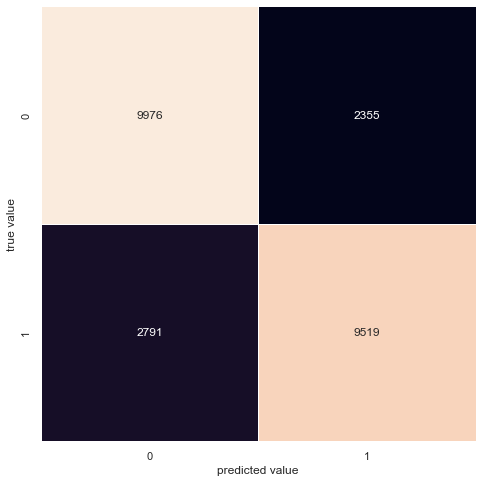

In [ ]:
# Gráfico de la matriz de confusión
sns.set(rc={'figure.figsize':(12, 8)})
sns.heatmap(cm, square=True, annot=True, cbar=False, fmt="d", linewidths=.5)
plt.xlabel('predicted value')
plt.ylabel('true value');

In [ ]:
# Información para registro en mlflow
l_clasificadores.append("Random Forest")
l_parametros.append([["criterion", p_criterion], ["max_depth", p_max_depth], ["max_features", p_max_features],
                     ["max_leaf_nodes", p_max_leaf_nodes], ["estimators", p_estimators], ["random_state", p_random_state]])
l_metrica_accuracy.append(m_accuracy)
l_metrica_precision.append(m_precision)
l_metrica_recall.append(m_recall)
l_metrica_f1.append(m_f1)
l_modelos.append(clf_rf)

## LGBM

In [ ]:
# Parámetros
p_random_state = 42

In [ ]:
# Entrenamiento
clf_lgbmc = lgb.LGBMClassifier(random_state=42)
clf_lgbmc.fit(X_train, y_train)

LGBMClassifier(random_state=42)

In [ ]:
# Predicción
y_pred_test = clf_lgbmc.predict(X_test)


In [ ]:
# Metricas
m_accuracy = metrics.accuracy_score(y_test, y_pred_test)
m_precision = metrics.precision_score(y_test, y_pred_test)
m_recall = metrics.recall_score(y_test, y_pred_test)
m_f1 = metrics.f1_score(y_test, y_pred_test)

print(f'Accuracy : {m_accuracy * 100:.6f} %')
print(f'Precisión : {m_precision * 100:.6f} %')
print(f'Recall : {m_recall * 100:.6f} %')
print(f'F1-Score : {m_f1 * 100:.6f} %')

Accuracy : 95.170651 %
Precisión : 98.986784 %
Recall : 91.267262 %
F1-Score : 94.970414 %


In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred_test)
class_report_RF = classification_report(y_test, y_pred_test)
print(class_report_RF)
print(cm)

              precision    recall  f1-score   support

           0       0.92      0.99      0.95     12331
           1       0.99      0.91      0.95     12310

    accuracy                           0.95     24641
   macro avg       0.95      0.95      0.95     24641
weighted avg       0.95      0.95      0.95     24641

[[12216   115]
 [ 1075 11235]]


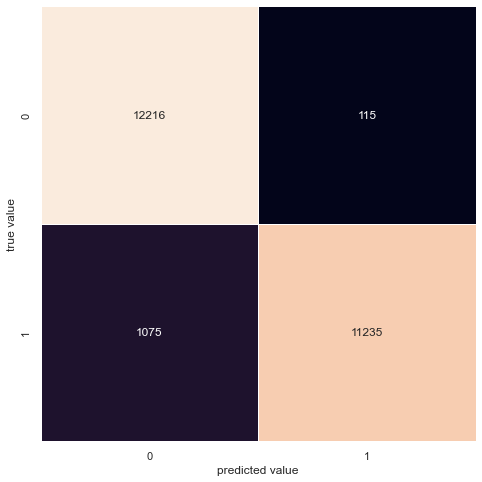

In [ ]:
# Gráfico de la matriz de confusión
sns.set(rc={'figure.figsize':(12, 8)})
sns.heatmap(cm, square=True, annot=True, fmt="d", cbar=False, linewidths=.5)
plt.xlabel('predicted value')
plt.ylabel('true value');

In [ ]:
# Información para registro en mlflow
l_clasificadores.append("LGBM")
l_parametros.append([["random_state", p_random_state]])
l_metrica_accuracy.append(m_accuracy)
l_metrica_precision.append(m_precision)
l_metrica_recall.append(m_recall)
l_metrica_f1.append(m_f1)
l_modelos.append(clf_lgbmc)

## Support Vector Machine

In [ ]:
# Parámteros
p_random_state = 42

In [ ]:
# Entrenamiento
clf_svm = SVC(random_state=p_random_state)
clf_svm.fit(X_train, y_train)

SVC(random_state=42)

In [ ]:
# Predicción
y_pred_test = clf_svm.predict(X_test)


In [ ]:
# Métricas
m_accuracy = metrics.accuracy_score(y_test, y_pred_test)
m_precision = metrics.precision_score(y_test, y_pred_test)
m_recall = metrics.recall_score(y_test, y_pred_test)
m_f1 = metrics.f1_score(y_test, y_pred_test)

print(f'Accuracy : {m_accuracy * 100:.6f} %')
print(f'Precisión : {m_precision * 100:.6f} %')
print(f'Recall : {m_recall * 100:.6f} %')
print(f'F1-Score : {m_f1 * 100:.6f} %')

Accuracy : 64.498194 %
Precisión : 77.544077 %
Recall : 40.731113 %
F1-Score : 53.408607 %


In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred_test)
class_report_RF = classification_report(y_test, y_pred_test)
print(class_report_RF)
print(cm)

              precision    recall  f1-score   support

           0       0.60      0.88      0.71     12331
           1       0.78      0.41      0.53     12310

    accuracy                           0.64     24641
   macro avg       0.69      0.64      0.62     24641
weighted avg       0.69      0.64      0.62     24641

[[10879  1452]
 [ 7296  5014]]


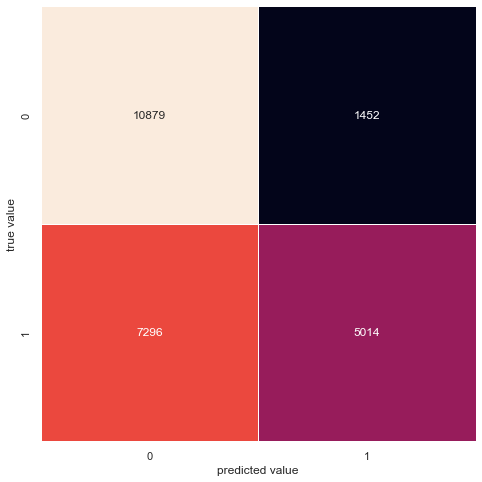

In [ ]:
# Gráfico de la matriz de confusión
sns.set(rc={'figure.figsize':(12, 8)})
sns.heatmap(cm, square=True, annot=True, fmt="d", cbar=False, linewidths=.5)
plt.xlabel('predicted value')
plt.ylabel('true value');

In [ ]:
# Información para registro en mlflow
l_clasificadores.append("Support Vector Machine")
l_parametros.append([["random_state", p_random_state]])
l_metrica_accuracy.append(m_accuracy)
l_metrica_precision.append(m_precision)
l_metrica_recall.append(m_recall)
l_metrica_f1.append(m_f1)
l_modelos.append(clf_svm)

## K - Nearest Neighbor

In [ ]:
# Parámetros
p_n_neighbors = 5

In [ ]:
# Entrenamiento
clf_knn = KNeighborsClassifier(n_neighbors = p_n_neighbors)
clf_knn.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
# Predicción
y_pred_test = clf_knn.predict(X_test)

In [ ]:
# Métricas
m_accuracy = metrics.accuracy_score(y_test, y_pred_test)
m_precision = metrics.precision_score(y_test, y_pred_test)
m_recall = metrics.recall_score(y_test, y_pred_test)
m_f1 = metrics.f1_score(y_test, y_pred_test)

print(f'Accuracy : {m_accuracy * 100:.6f} %')
print(f'Precisión : {m_precision * 100:.6f} %')
print(f'Recall : {m_recall * 100:.6f} %')
print(f'F1-Score : {m_f1 * 100:.6f} %')

Accuracy : 86.668561 %
Precisión : 79.296241 %
Recall : 99.220146 %
F1-Score : 88.146357 %


In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred_test)
class_report_RF = classification_report(y_test, y_pred_test)
print(class_report_RF)
print(cm)

              precision    recall  f1-score   support

           0       0.99      0.74      0.85     12331
           1       0.79      0.99      0.88     12310

    accuracy                           0.87     24641
   macro avg       0.89      0.87      0.86     24641
weighted avg       0.89      0.87      0.86     24641

[[ 9142  3189]
 [   96 12214]]


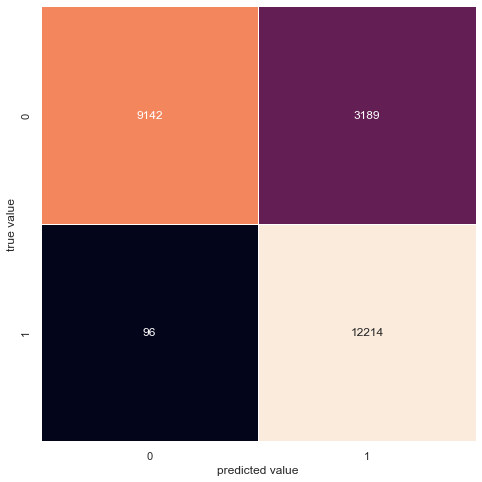

In [ ]:
sns.set(rc={'figure.figsize':(12, 8)})
sns.heatmap(cm, square=True, annot=True, fmt="d", cbar=False, linewidths=.5)
plt.xlabel('predicted value')
plt.ylabel('true value');

In [ ]:
# Información para registro en mlflow
l_clasificadores.append("K-Nearest Neighbor")
l_parametros.append([["n_neighbors", p_n_neighbors]])
l_metrica_accuracy.append(m_accuracy)
l_metrica_precision.append(m_precision)
l_metrica_recall.append(m_recall)
l_metrica_f1.append(m_f1)
l_modelos.append(clf_knn)

## Naive Bayes

In [ ]:
# Entrenamiento
clf_nb = GaussianNB()
clf_nb.fit(X_train, y_train)

GaussianNB()

In [ ]:
# Predicción
y_pred_test = clf_nb.predict(X_test)


In [ ]:
# Métricas
m_accuracy = metrics.accuracy_score(y_test, y_pred_test)
m_precision = metrics.precision_score(y_test, y_pred_test)
m_recall = metrics.recall_score(y_test, y_pred_test)
m_f1 = metrics.f1_score(y_test, y_pred_test)

print(f'Accuracy : {m_accuracy * 100:.6f} %')
print(f'Precisión : {m_precision * 100:.6f} %')
print(f'Recall : {m_recall * 100:.6f} %')
print(f'F1-Score : {m_f1 * 100:.6f} %')

Accuracy : 50.383507 %
Precisión : 50.178937 %
Recall : 95.678310 %
F1-Score : 65.831983 %


In [ ]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred_test)
class_report_RF = classification_report(y_test, y_pred_test)
print(class_report_RF)
print(cm)

              precision    recall  f1-score   support

           0       0.54      0.05      0.09     12331
           1       0.50      0.96      0.66     12310

    accuracy                           0.50     24641
   macro avg       0.52      0.50      0.38     24641
weighted avg       0.52      0.50      0.38     24641

[[  637 11694]
 [  532 11778]]


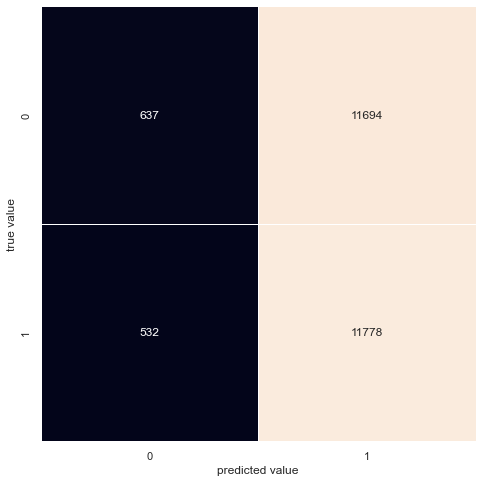

In [ ]:
sns.set(rc={'figure.figsize':(12, 8)})
sns.heatmap(cm, square=True, annot=True, fmt="d", cbar=False, linewidths=.5)
plt.xlabel('predicted value')
plt.ylabel('true value');

In [ ]:
# Información para registro en mlflow
l_clasificadores.append("Naive Bayes")
l_parametros.append([["Ninguno", 0]])
l_metrica_accuracy.append(m_accuracy)
l_metrica_precision.append(m_precision)
l_metrica_recall.append(m_recall)
l_metrica_f1.append(m_f1)
l_modelos.append(clf_nb)

In [ ]:
print(l_clasificadores)

['Logistic Regression', 'Decision Tree', 'Random Forest', 'LGBM', 'Support Vector Machine', 'K-Nearest Neighbor', 'Naive Bayes', 'Random Forest']


In [ ]:
print(l_parametros)

[[['C', 1], ['Solver', 'lbfgs'], ['max_iter', 1000], ['random_state', 42]], [['random_state', 42], ['criterion', 'entropy'], ['max_deep', 12]], [['criterion', 'gini'], ['max_depth', 3], ['max_features', 'auto'], ['max_leaf_nodes', 2], ['estimators', 10], ['random_state', 42]], [['random_state', 42]], [['random_state', 42]], [['n_neighbors', 5]], [['Ninguno', 0]], [['criterion', 'gini'], ['max_depth', 7], ['max_features', 'auto'], ['max_leaf_nodes', 10], ['estimators', 10], ['random_state', 42]]]


In [ ]:
print(l_metrica_accuracy)
print(l_metrica_precision)
print(l_metrica_recall)
print(l_metrica_f1)

[0.6860111196785845, 0.9107990747128769, 0.7240777565845542, 0.9517065054177996, 0.6449819406679924, 0.866685605291993, 0.5038350716285865, 0.7911610730084007]
[0.7069792703901512, 0.927315753887762, 0.7502497502497503, 0.9898678414096916, 0.7754407670893907, 0.7929624099201454, 0.5017893660531697, 0.8016675088428499]
[0.6344435418359058, 0.8913078797725427, 0.6710804224207961, 0.912672623883022, 0.4073111291632819, 0.9922014622258326, 0.956783103168156, 0.7732737611697806]
[0.6687502675857344, 0.908955347527131, 0.7084601860983663, 0.9497041420118344, 0.5340860673199829, 0.8814635730523582, 0.6583198256106423, 0.7872146873966259]


In [ ]:
results = pd.DataFrame({
    'Model': l_clasificadores,
    'Accuracy': l_metrica_accuracy,
    'Precision': l_metrica_precision,
    'Recall': l_metrica_recall,
    'F1_Score': l_metrica_f1})

result_df = results.sort_values(by='Accuracy', ascending=False)
result_df = result_df.set_index('Model')
result_df.head(7)

,Accuracy,Precision,Recall,F1_Score
Model,,,,
LGBM,0.95,0.99,0.91,0.95
Decision Tree,0.91,0.93,0.89,0.91
K-Nearest Neighbor,0.87,0.79,0.99,0.88
Random Forest,0.79,0.80,0.77,0.79
Random Forest,0.72,0.75,0.67,0.71
Logistic Regression,0.69,0.71,0.63,0.67
Support Vector Machine,0.64,0.78,0.41,0.53


In [ ]:
l = []
l_metricas = []
for i in range (0, len(l_clasificadores)):
    l = [l_metrica_accuracy[i], l_metrica_precision[i], l_metrica_recall[i], l_metrica_f1[i]]
    l_metricas.extend([l])

print(l_metricas)

[[0.6860111196785845, 0.7069792703901512, 0.6344435418359058, 0.6687502675857344], [0.9107990747128769, 0.927315753887762, 0.8913078797725427, 0.908955347527131], [0.7240777565845542, 0.7502497502497503, 0.6710804224207961, 0.7084601860983663], [0.9517065054177996, 0.9898678414096916, 0.912672623883022, 0.9497041420118344], [0.6449819406679924, 0.7754407670893907, 0.4073111291632819, 0.5340860673199829], [0.866685605291993, 0.7929624099201454, 0.9922014622258326, 0.8814635730523582], [0.5038350716285865, 0.5017893660531697, 0.956783103168156, 0.6583198256106423], [0.7911610730084007, 0.8016675088428499, 0.7732737611697806, 0.7872146873966259]]


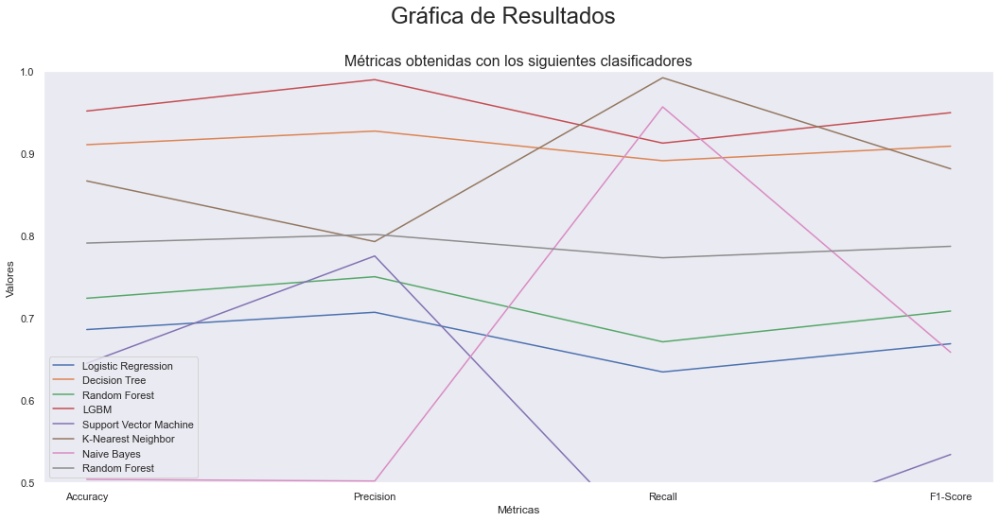

In [ ]:
l_labels = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
plt.figure(figsize=(18, 8))
plt.ylim(0.5, 1)

for i in range(0, len(l_metricas)):
    plt.plot(l_metricas[i], label = l_clasificadores[i])

plt.title('Métricas obtenidas con los siguientes clasificadores',fontsize=16)
plt.suptitle('Gráfica de Resultados',fontsize=24, y=1)
plt.xlabel('Métricas')
plt.ylabel('Valores')
plt.legend()
plt.grid()
plt.xticks(list(range(len(l_labels))), l_labels)

plt.savefig("Gráfica_resultados.jpg")

plt.show()

## Registro en el mlflow

In [ ]:
# Nombre del experimento
experiment_name = "Dataset_Unificado_Notebook_3"

In [ ]:
# Revisar si el experimento ya existe
if not mlflow.get_experiment_by_name(experiment_name):
    mlflow.create_experiment(name=experiment_name)

experiment = mlflow.get_experiment_by_name(experiment_name)

In [ ]:
# Información dataset
rows = X.shape[0]
columns = X.shape[1]

In [ ]:
# Registrar experimento
for i in range(0, len(l_clasificadores)):
    with mlflow.start_run(experiment_id = experiment.experiment_id, run_name=l_clasificadores[i]):

        # Registro de parámetros fijos
        mlflow.log_param("No. muestras", rows )
        mlflow.log_param("No. de caracteristicas", columns)

        # Columnas elegidas
        mlflow.log_param("columnas_elegidas", ranking_df.columns)

        # Registro de parámetros variables por algoritmo
        for j in range(0, len(l_parametros[i])):
            mlflow.log_param(l_parametros[i][j][0], l_parametros[i][j][1])

        # Registro de métricas
        mlflow.log_metric('Accuracy', l_metricas[i][0])
        mlflow.log_metric('Precision', l_metricas[i][1])
        mlflow.log_metric('Recall', l_metricas[i][2])
        mlflow.log_metric('F1_score', l_metricas[i][3])

        # Registro de modelos
        mlflow.sklearn.log_model(l_modelos[i],type(l_modelos[i]).__name__)

#mlflow.log_figure(plt.figure, "Gráfica_resultados.jpg")

In [ ]:
sinfo()
print(sklearn.show_versions())

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
fitter      1.4.1
imblearn    0.9.1
keras       2.9.0
lightgbm    3.3.2
matplotlib  3.5.1
mlflow      1.27.0
mlxtend     0.20.0
numpy       1.21.5
pandas      1.4.2
scipy       1.7.3
seaborn     0.11.2
sinfo       0.3.4
sklearn     1.0.2
statsmodels 0.13.2
xgboost     1.6.1
-----
IPython             8.2.0
jupyter_client      6.1.12
jupyter_core        4.9.2
jupyterlab          3.3.2
notebook            6.4.8
-----
Python 3.9.12 (main, Apr  4 2022, 05:22:27) [MSC v.1916 64 bit (AMD64)]
Windows-10-10.0.252